# Load DAPI image and do segmenation

for dense z-stack of DAPI images, which could translate into DNA-FISH

In [1]:
%run "..\Startup_py3.py"
sys.path.append(r"..\..\..\Documents")

import ImageAnalysis3 as ia
%matplotlib notebook

from ImageAnalysis3 import *
print(os.getpid())

import h5py
from ImageAnalysis3.classes import _allowed_kwds
import ast

928


In [2]:
data_folder = r'\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear'
folders, fovs = ia.io_tools.data.get_folders(data_folder)
ref_id = 0
ref_folder = folders[ref_id]
print(ref_folder)

Get Folder Names: (ia.get_img_info.get_folders)
- Number of folders: 11
- Number of field of views: 163
\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1


In [3]:
correction_folder = r'\\10.245.74.158\Chromatin_NAS_0\Corrections\20210621-Corrections_lumencor_from_60_to_50'

segmentation_folder = os.path.join(data_folder, 'Segmentation')
if not os.path.exists(segmentation_folder):
    print(f"Create segmentation_folder: {segmentation_folder}")
    os.makedirs(segmentation_folder)
else:
    print(f"Use segmentation_folder: {segmentation_folder}")

segmentation_figure_folder = os.path.join(segmentation_folder, 'Figures')
if not os.path.exists(segmentation_figure_folder):
    print(f"Create segmentation_figure_folder: {segmentation_figure_folder}")
    os.makedirs(segmentation_figure_folder)
else:
    print(f"Use segmentation_figure_folder: {segmentation_figure_folder}")
from ImageAnalysis3.figure_tools import plot_segmentation    
    
from ImageAnalysis3.segmentation_tools import cell  
pixel_sizes = [250,108,108]
single_im_size = [50,2048,2048]


Use segmentation_folder: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation
Use segmentation_figure_folder: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures


In [4]:
# Load image
# Load image
for _fov in fovs:
    image_filename = os.path.join(ref_folder, _fov)

    segmentation_filename = os.path.join(segmentation_folder, 
                                         _fov.replace('.dax', '_Segmentation.npy') )
    dapi_filename = os.path.join(segmentation_folder, 
                                 os.path.basename(_fov).replace('.dax', '_Dapi.npy') )

    if os.path.exists(dapi_filename):
        _dapi_im = np.load(dapi_filename)
    else:
        # load image
        _polyt_im, _dapi_im = ia.io_tools.load.correct_fov_image(
            image_filename, [488,405],
            single_im_size=[50,2048,2048],
            num_empty_frames=0, num_buffer_frames=0,
            all_channels=[750,647,561,488,405],
            calculate_drift=False, 
            correction_folder=correction_folder,
            illumination_corr=True, hot_pixel_corr=True,
        )[0]
    break

- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_000.dax
-- loading illumination correction profile from file:
	 488 illumination_correction_488_2048x2048.npy
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_000.dax  in 3.731s
-- removing hot pixels for channels:['488', '405'] in 5.501s
-- illumination correction for channels: 488, 405, in 1.844s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 11.578s


In [112]:
from typing import List, Dict, Tuple

def combine_2d_segmentation_masks_into_3d(segmentationOutput:
                                          np.ndarray,
                                         minKept_zLen = 2) -> np.ndarray:
    """Take a 3 dimensional segmentation masks and relabel them so that
    nuclei in adjacent sections have the same label if the area their
    overlap surpases certain threshold
    Args:
        segmentationOutput: a 3 dimensional numpy array containing the
            segmentation masks arranged as (z, x, y).
    Returns:
        ndarray containing a 3 dimensional mask arranged as (z, x, y) of
            relabeled segmented cells
    """

    # Initialize empty array with size as segmentationOutput array
    segmentationCombinedZ = np.zeros(segmentationOutput.shape)

    # copy the mask of the section farthest to the coverslip to start
    segmentationCombinedZ[-1, :, :] = segmentationOutput[-1, :, :]

    # starting far from coverslip
    for z in range(segmentationOutput.shape[0]-1, 0, -1):

        # get non-background cell indexes for plane Z
        zIndex = np.unique(segmentationCombinedZ[z, :, :])[
                                np.unique(segmentationCombinedZ[z, :, :]) > 0]

        # get non-background cell indexes for plane Z-1
        zm1Index = np.unique(segmentationOutput[z-1, :, :])[
                                np.unique(segmentationOutput[z-1, :, :]) > 0]
        assigned_zm1Index = []

        # compare each cell in z0
        for n0 in zIndex:
            n1, f0, f1 = get_overlapping_objects(segmentationCombinedZ[z, :, :],
                                                 segmentationOutput[z-1, :, :],
                                                 n0)
            if n1:
                segmentationCombinedZ[z-1, :, :][
                    (segmentationOutput[z-1, :, :] == n1)] = n0
                assigned_zm1Index.append(n1)

        # keep the un-assigned indices in the Z-1 plane
        unassigned_zm1Index = [i for i in zm1Index if i not in assigned_zm1Index]
        max_current_id = np.max(segmentationCombinedZ[z-1:, :, :])
        for i in range(len(unassigned_zm1Index)):
            unassigned_id = unassigned_zm1Index[i]
            segmentationCombinedZ[z-1, :, :][
                    (segmentationOutput[z-1, :, :] == unassigned_id)] = max_current_id + 1 +i
    # remove label with only 1 z-layer
    
    segmentationCleanedZ = np.zeros(segmentationOutput.shape, dtype=np.int16)
    for _lb in np.arange(1, np.max(segmentationCombinedZ)+1):
        _cellMask = (segmentationCombinedZ==_lb)
        _cell_zIndex = np.where(_cellMask.any((1,2)))[0]
        #print(_cell_zIndex)
        if len(_cell_zIndex) <= minKept_zLen:
            continue
        else:
            segmentationCleanedZ[segmentationCombinedZ==_lb] = np.max(segmentationCleanedZ) + 1
            
    return segmentationCleanedZ

def get_overlapping_objects(segmentationZ0: np.ndarray,
                            segmentationZ1: np.ndarray,
                            n0: int,
                            fraction_threshold0: float=0.4,
                            fraction_threshold1: float=0.4) -> Tuple[np.float64, 
                                              np.float64, np.float64]:
    """compare cell labels in adjacent image masks
    Args:
        segmentationZ0: a 2 dimensional numpy array containing a
            segmentation mask in position Z
        segmentationZ1: a 2 dimensional numpy array containing a
            segmentation mask adjacent to segmentationZ0
        n0: an integer with the index of the object (cell/nuclei)
            to be compared between the provided segmentation masks
    Returns:
        a tuple (n1, f0, f1) containing the label of the cell in Z1
        overlapping n0 (n1), the fraction of n0 overlaping n1 (f0) and
        the fraction of n1 overlapping n0 (f1)
    """

    z1Indexes = np.unique(segmentationZ1[segmentationZ0 == n0])

    z1Indexes = z1Indexes[z1Indexes > 0]

    if z1Indexes.shape[0] > 0:
        # calculate overlap fraction
        n0Area = np.count_nonzero(segmentationZ0 == n0)
        n1Area = np.zeros(len(z1Indexes))
        overlapArea = np.zeros(len(z1Indexes))

        for ii in range(len(z1Indexes)):
            n1 = z1Indexes[ii]
            n1Area[ii] = np.count_nonzero(segmentationZ1 == n1)
            overlapArea[ii] = np.count_nonzero((segmentationZ0 == n0) *
                                               (segmentationZ1 == n1))

        n0OverlapFraction = np.asarray(overlapArea / n0Area)
        n1OverlapFraction = np.asarray(overlapArea / n1Area)
        index = list(range(len(n0OverlapFraction)))

        # select the nuclei that has the highest fraction in n0 and n1
        r1, r2, indexSorted = zip(*sorted(zip(n0OverlapFraction,
                                              n1OverlapFraction,
                                              index),
                                  key=lambda x:x[0]+x[1],
                                  reverse=True))

        if (n0OverlapFraction[indexSorted[0]] > fraction_threshold0 and
                n1OverlapFraction[indexSorted[0]] > fraction_threshold1):
            return (z1Indexes[indexSorted[0]],
                    n0OverlapFraction[indexSorted[0]],
                    n1OverlapFraction[indexSorted[0]])
        else:
            return (False, False, False)
    else:
        return (False, False, False)
from skimage import exposure
def scale_image(img, saturation_percentile=99.9):
    return np.minimum(img, np.percentile(img, saturation_percentile))

def adaptive_equalize_hist_individual_z(image, clip_limit=0.03):
    image_normalized = [image[z] / np.max(image[z]) for z in range(image.shape[0])]
    return np.array([exposure.equalize_adapthist(image_normalized[z], clip_limit=clip_limit) 
                    for z in range(image.shape[0])])


def preprocess_image_channels(nuclear_image, membrane_marker_image):
    # Remove the hot-pixels
    nuclear_image = scale_image(nuclear_image, 99.9)
    membrane_marker_image = scale_image(membrane_marker_image, 99.9)

    # Enhance the contrast by adaptive histogram equalization
    nuclear_image = adaptive_equalize_hist_individual_z(nuclear_image, clip_limit=0.05)
    membrane_marker_image = adaptive_equalize_hist_individual_z(membrane_marker_image, clip_limit=0.05)

    return nuclear_image, membrane_marker_image

In [123]:
_sel_polyt_im = minimum_filter((_sel_polyt_im[::4]), 4)
_sel_dapi_im = minimum_filter(_sel_dapi_im[::4], 4)
_zero_im = np.zeros(np.shape(_sel_dapi_im))

_sel_dapi_im, _sel_polyt_im = preprocess_image_channels(_sel_dapi_im, _sel_polyt_im)

In [125]:
?_model.eval

In [6]:
from cellpose import models


In [8]:
from scipy.ndimage.filters import minimum_filter, gaussian_filter
_sel_polyt_im = minimum_filter((_polyt_im[::4]), 4)
#_sel_polyt_im = gaussian_filter(_sel_polyt_im, 4)
_sel_dapi_im = minimum_filter(_dapi_im[::4], 4)
#_sel_dapi_im = gaussian_filter(_sel_dapi_im, 4)
_zero_im = np.zeros(np.shape(_sel_dapi_im))

In [132]:
_model = models.Cellpose(gpu=True, model_type='cyto2', )

In [141]:
%%time
_results = _model.eval(np.stack([_sel_dapi_im, _sel_dapi_im], axis=3),
                       channels=[1,2], diameter=100, min_size=200, 
                       flow_threshold=0.2,
                       )

Wall time: 1min 8s


In [142]:
%%time
_combined_mask = combine_2d_segmentation_masks_into_3d(_results[0])

Wall time: 9.47 s


<IPython.core.display.Javascript object>


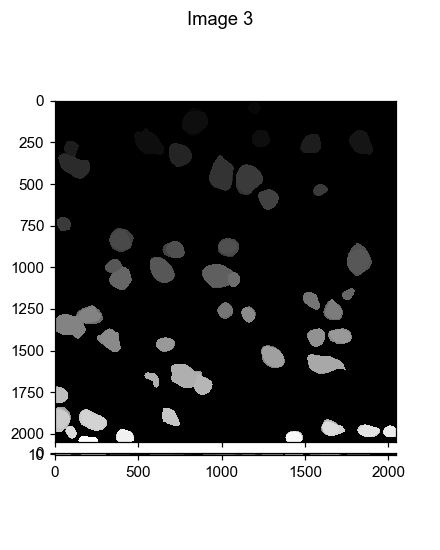

In [166]:
visual_tools.imshow_mark_3d_v2([_sel_polyt_im,_sel_dapi_im, _results[0], _combined_mask])

In [154]:

print(_sel_dapi_im.shape)

(13, 2048, 2048)


In [9]:
%%time
_nucl_model = models.Cellpose(gpu=True, model_type='nuclei', )
_nucl_results = _nucl_model.eval(np.stack([_sel_dapi_im, _sel_dapi_im], axis=3),
                       channels=[1,0], diameter=50, min_size=200, 
                       flow_threshold=0.2,
                       )

Wall time: 40.4 s


In [10]:
%%time
_nucl_mask = combine_2d_segmentation_masks_into_3d(_nucl_results[0])

[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 3  4  5  6  7  8  9 10 11 12]
[ 5  6  7  8  9 10 11 12]
[ 6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[11 12]
[ 1  2  3  4  5  6  7  8  9 10 11 12]
[ 3  4  5  6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 4  5  6  7  8  9 10 11 12]
[ 4  5  6  7  8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
[ 8  9 10 11 12]
[ 8  9 10 11 12]
[ 0  1  2  3  4  5  6  7  8  9 10 11]
[ 0  1  2  3  4  5  6  7  8  9 10 11]
[ 0  1  2  3  4  5  6  7  8  9 10 11]
[ 4  5  6  7  8  9 10 11]
[ 3  4  5  6  7  8  9 10 11]
[ 1  2  3  4  5  6  7  8  9 10]
[ 0  1  2  3  4  5  6  7  8  9 10]
[ 0  1  2  3  4  5  6  7  8  9 10]
[ 0  1  2  3  4  5  6  7  8  9 10]
[ 3  4  5  6  7  8  9 10]
[ 0  1  2  3  4  5  6  7  8  9 10]
[10]
[ 5  6  7  8  9 10]
[ 5  6  7  8  9 10]
[ 0  1  2

In [115]:
%%time
_sel_dapi_im = gaussian_filter(_dapi_im[::], 1)

Wall time: 5.78 s


In [116]:
%%time
_full_nucl = _nucl_model.eval(np.stack([_sel_dapi_im,_sel_dapi_im], axis=3),
                       channels=[1,0], diameter=50, min_size=200, 
                       flow_threshold=0.2, stitch_threshold=0.1,
                       )

RuntimeError: CUDA error: the launch timed out and was terminated
CUDA kernel errors might be asynchronously reported at some other API call,so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.

In [108]:
%%time
_full_mask = combine_2d_segmentation_masks_into_3d(_full_nucl[0], 
                                                   minKept_zLen=np.round(_full_nucl[0].shape[0]/10),
                                                  )

Wall time: 1min 3s


In [111]:
_full_nucl[0].shape[0]

25

<IPython.core.display.Javascript object>


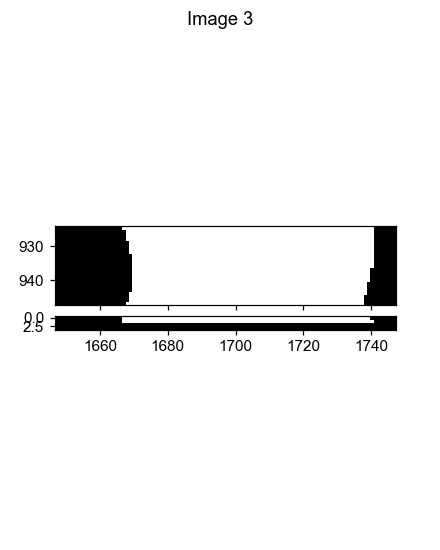

In [109]:
visual_tools.imshow_mark_3d_v2([_sel_dapi_im, _full_nucl[0], _full_mask])

In [98]:
import numpy as np
import cv2
from scipy import ndimage
from skimage import morphology
from skimage import filters
from skimage import measure
from typing import Tuple

def prepare_watershed_images(watershedImageStack: np.ndarray,
                             mask_threshold:float=1.1,
                             ) -> Tuple[np.ndarray, np.ndarray]:
    """Prepare the given images as the input image for watershedding.

    A watershed mask is determined using an adaptive threshold and the watershed
    images are inverted so the largest values in the watershed images become
    minima and then the image stack is normalized to have values between 0
    and 1.

    Args:
        watershedImageStack: a 3 dimensional numpy array containing the images
            arranged as (z, x, y).
    Returns: a tuple containing the normalized watershed images and the
        calculated watershed mask
    """
    filterSize = int(2 * np.floor(watershedImageStack.shape[1] / 16) + 1)
    
    watershedMask = np.array([ndimage.morphology.binary_fill_holes(
        x > mask_threshold * filters.threshold_local(x, filterSize, method='mean',
                                          mode='nearest'))
        for x in watershedImageStack])

    normalizedWatershed = 1 - (watershedImageStack
                               - np.min(watershedImageStack)) / \
                          (np.max(watershedImageStack)
                           - np.min(watershedImageStack))
    normalizedWatershed[np.invert(watershedMask)] = 1

    return normalizedWatershed, watershedMask

In [95]:
_wtim, _wtmsk = prepare_watershed_images(_polyt_im[::4])

<IPython.core.display.Javascript object>


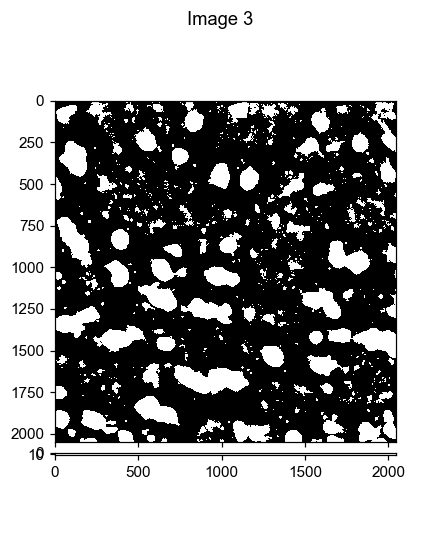

In [97]:
visual_tools.imshow_mark_3d_v2([_full_mask, _wtim, _wtmsk])

In [27]:
from skimage import segmentation

In [45]:
_full_mask[_full_mask==-1] = 0

In [70]:
from scipy.ndimage.filters import minimum_filter, gaussian_filter, maximum_filter

watershed_im = 1- maximum_filter(_polyt_im[::4],5) / np.max(_polyt_im)

In [75]:
%%time
watershed_mask = segmentation.watershed(watershed_im, _full_mask, connectivity=np.ones((3,3,3)))

Wall time: 1min 10s


<IPython.core.display.Javascript object>


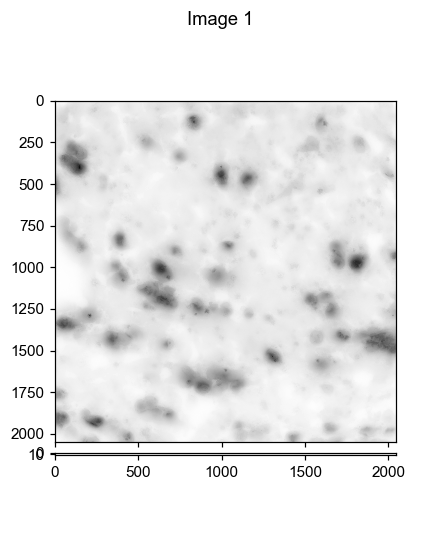

In [71]:
visual_tools.imshow_mark_3d_v2([watershed_im, _polyt_im[::4]])

In [74]:
%%time
watershed_mask = segmentation.random_walker(watershed_im[5], _full_mask[5], 
                                            beta=10, )

KeyboardInterrupt: 

ModuleNotFoundError: No module named 'merlin'

<IPython.core.display.Javascript object>


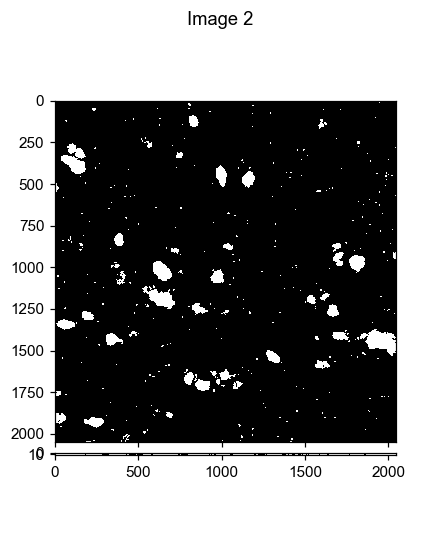

In [78]:
visual_tools.imshow_mark_3d_v2([watershed_im, watershed_im < 0.4])

<IPython.core.display.Javascript object>


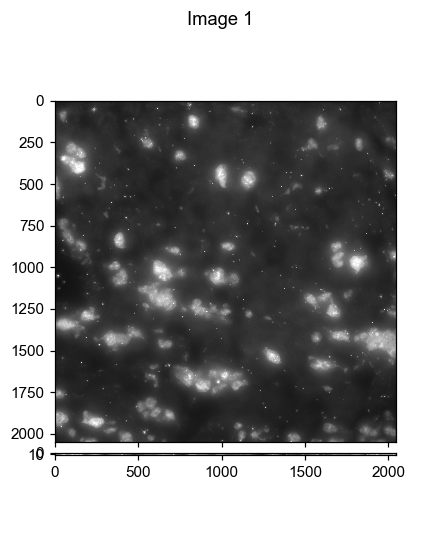

In [76]:
%matplotlib notebook
visual_tools.imshow_mark_3d_v2([_polyt_im[::4], _full_mask, watershed_mask])

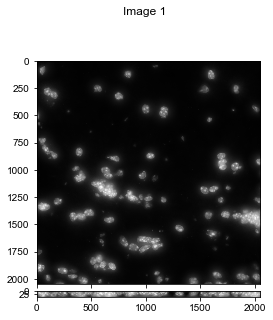

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_000_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_001.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_001.dax  in 3.955s
-- removing hot pixels for channels:['405'] in 2.984s
-- illumination correction for channels: 405, in 0.984s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.241s


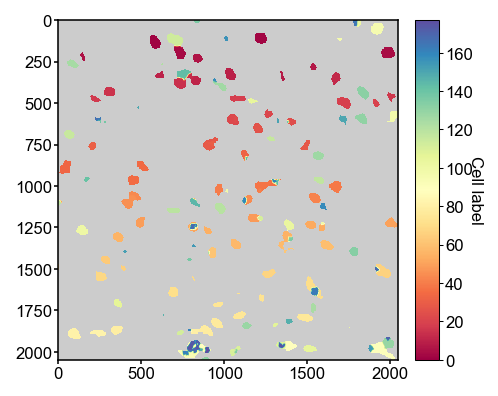

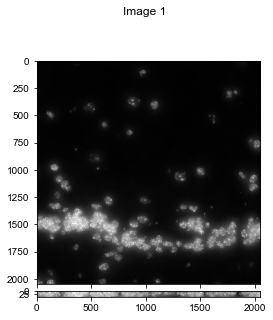

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_001_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_002.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_002.dax  in 4.572s
-- removing hot pixels for channels:['405'] in 3.129s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.938s


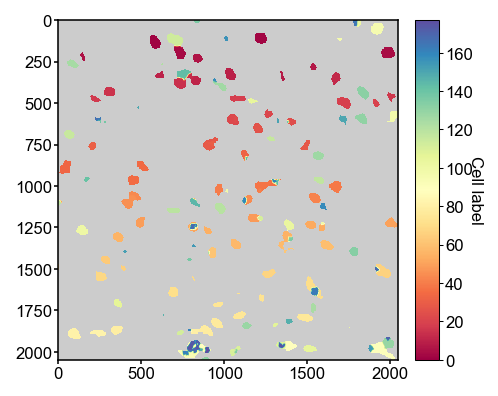

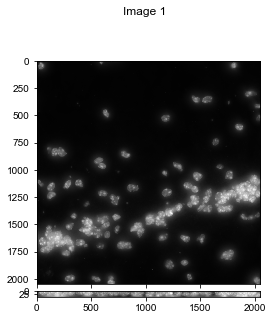

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_002_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_003.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_003.dax  in 3.566s
-- removing hot pixels for channels:['405'] in 3.047s
-- illumination correction for channels: 405, in 1.032s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.875s


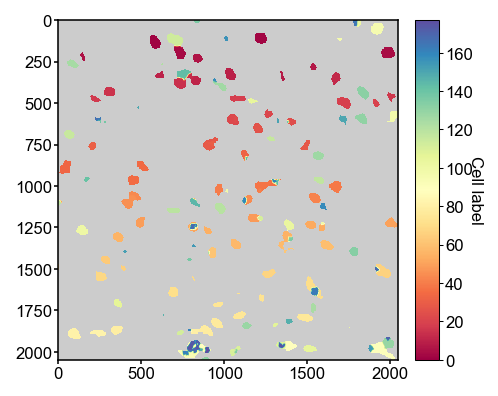

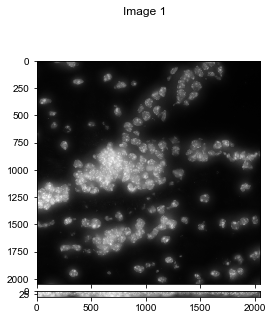

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_003_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_004.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_004.dax  in 5.609s
-- removing hot pixels for channels:['405'] in 3.107s
-- illumination correction for channels: 405, in 0.924s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.869s


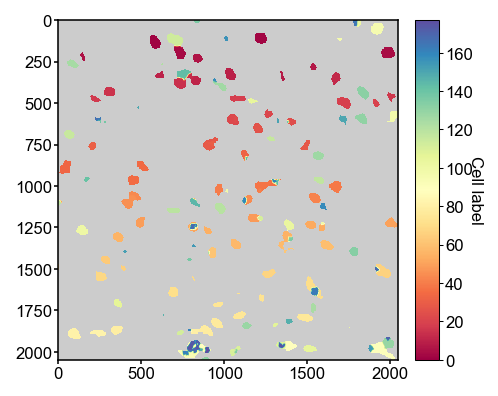

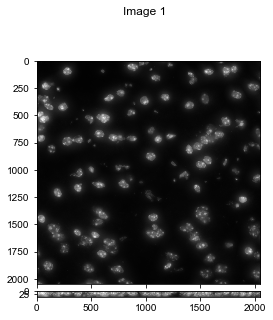

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_004_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_005.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_005.dax  in 3.731s
-- removing hot pixels for channels:['405'] in 2.984s
-- illumination correction for channels: 405, in 0.971s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.966s


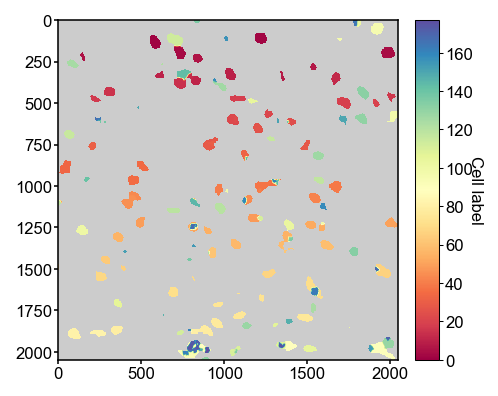

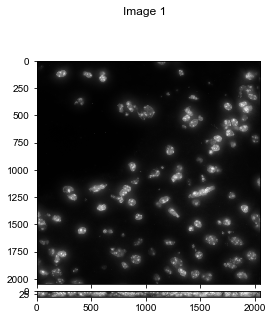

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_005_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_006.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_006.dax  in 5.305s
-- removing hot pixels for channels:['405'] in 2.938s
-- illumination correction for channels: 405, in 0.962s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.500s


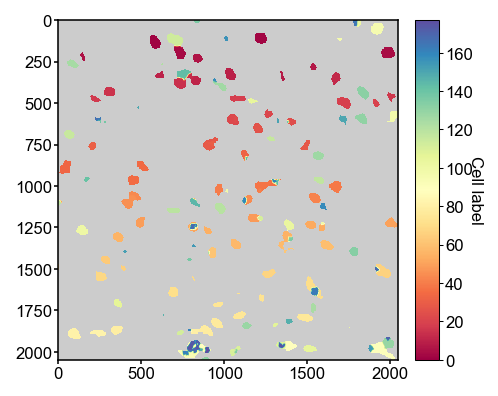

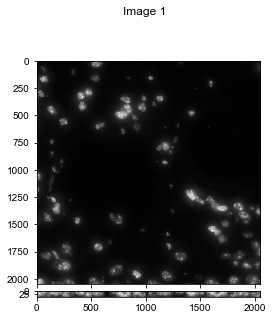

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_006_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_007.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_007.dax  in 3.492s
-- removing hot pixels for channels:['405'] in 2.955s
-- illumination correction for channels: 405, in 0.951s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.657s


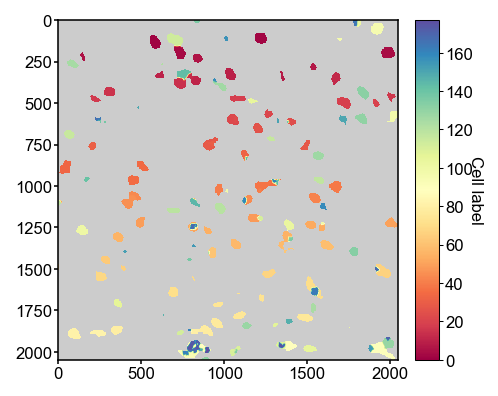

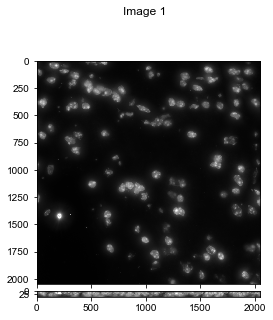

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_007_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_008.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_008.dax  in 4.480s
-- removing hot pixels for channels:['405'] in 2.953s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.662s


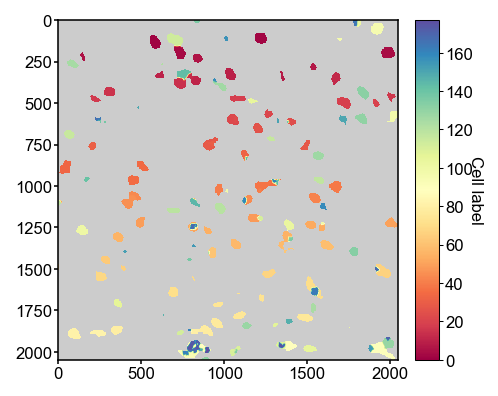

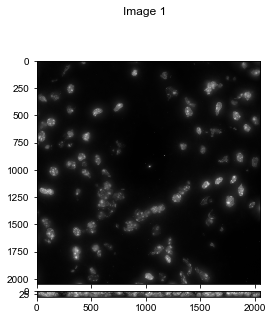

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_008_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_009.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_009.dax  in 3.976s
-- removing hot pixels for channels:['405'] in 2.891s
-- illumination correction for channels: 405, in 0.969s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.047s


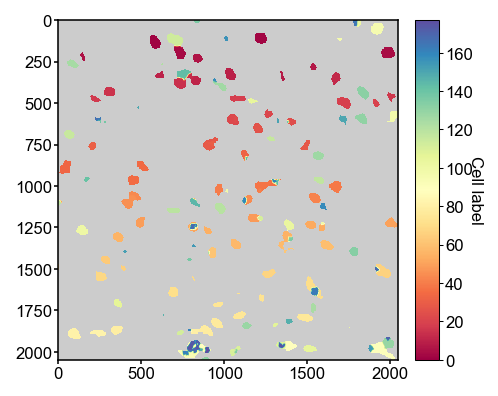

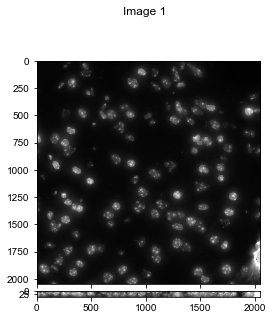

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_009_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_010.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_010.dax  in 4.912s
-- removing hot pixels for channels:['405'] in 3.110s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.283s


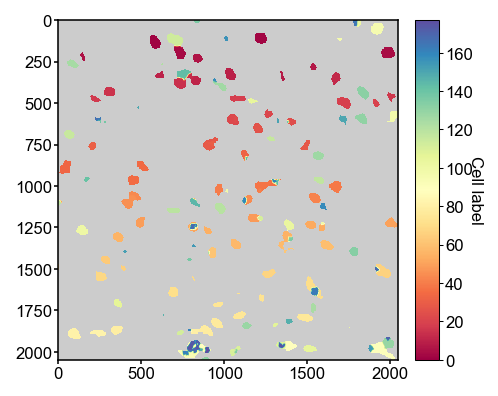

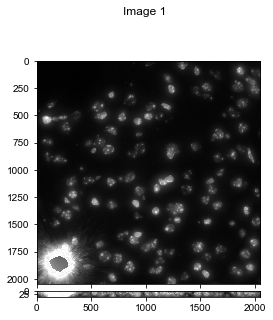

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_010_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_011.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_011.dax  in 4.042s
-- removing hot pixels for channels:['405'] in 3.026s
-- illumination correction for channels: 405, in 1.073s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.360s


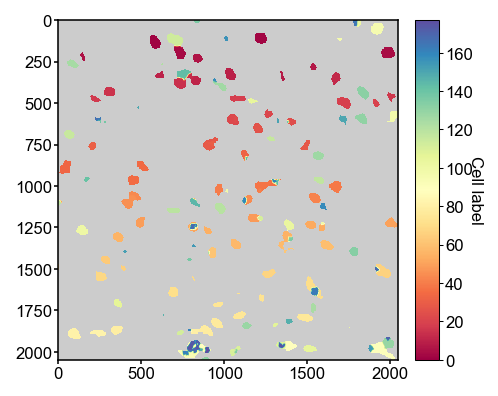

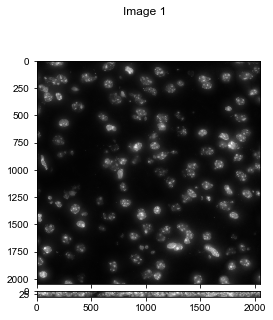

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_011_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_012.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_012.dax  in 5.091s
-- removing hot pixels for channels:['405'] in 3.143s
-- illumination correction for channels: 405, in 1.029s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.532s


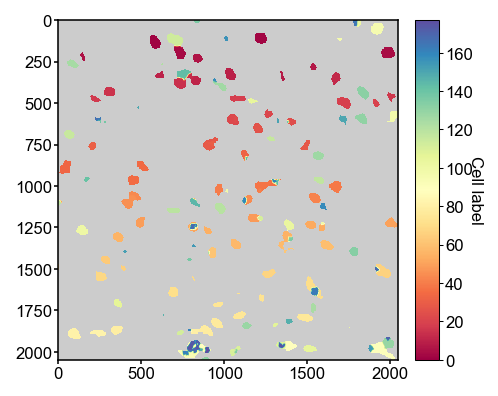

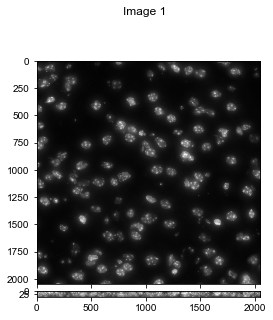

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_012_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_013.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_013.dax  in 3.171s
-- removing hot pixels for channels:['405'] in 3.172s
-- illumination correction for channels: 405, in 0.969s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.594s


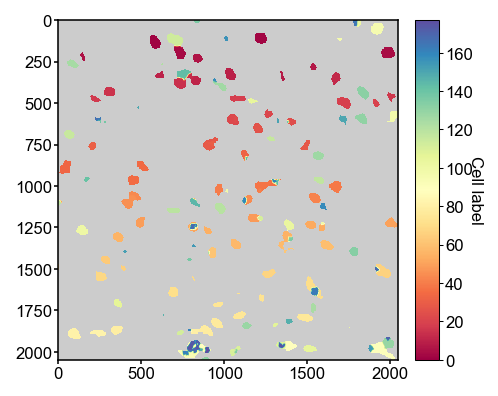

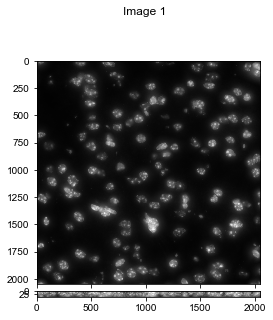

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_013_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_014.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_014.dax  in 5.014s
-- removing hot pixels for channels:['405'] in 3.000s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.297s


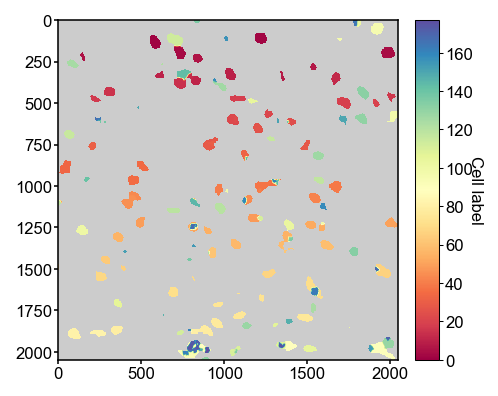

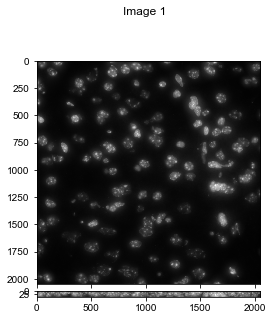

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_014_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_015.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_015.dax  in 4.018s
-- removing hot pixels for channels:['405'] in 2.922s
-- illumination correction for channels: 405, in 0.953s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.161s


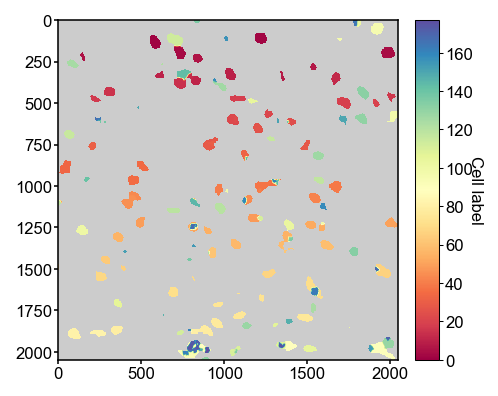

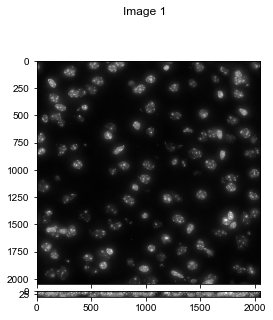

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_015_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_016.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_016.dax  in 4.802s
-- removing hot pixels for channels:['405'] in 2.969s
-- illumination correction for channels: 405, in 0.954s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.954s


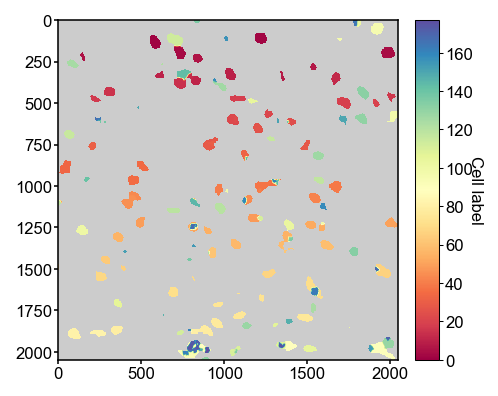

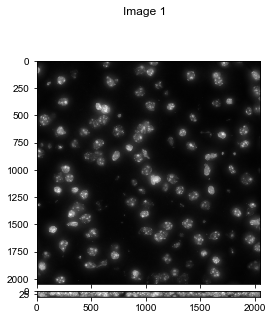

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_016_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_017.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_017.dax  in 4.015s
-- removing hot pixels for channels:['405'] in 3.047s
-- illumination correction for channels: 405, in 1.078s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.351s


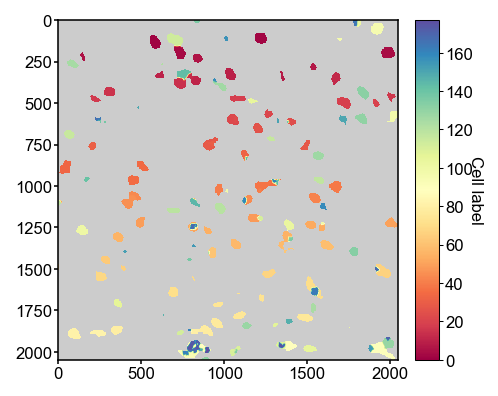

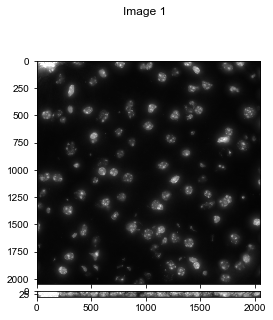

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_017_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_018.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_018.dax  in 5.173s
-- removing hot pixels for channels:['405'] in 3.074s
-- illumination correction for channels: 405, in 0.969s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.421s


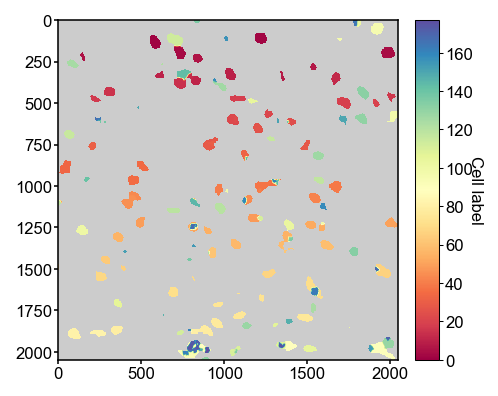

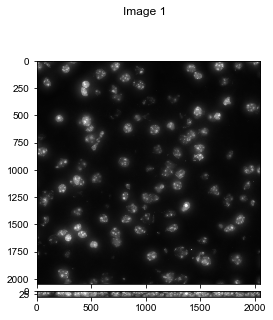

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_018_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_019.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_019.dax  in 3.875s
-- removing hot pixels for channels:['405'] in 3.121s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.315s


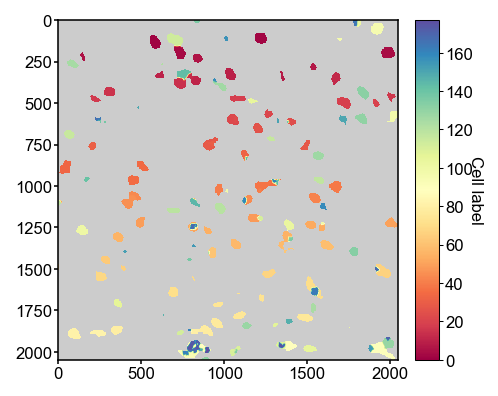

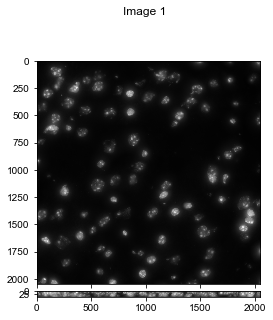

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_019_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_020.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_020.dax  in 5.361s
-- removing hot pixels for channels:['405'] in 3.088s
-- illumination correction for channels: 405, in 0.988s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.711s


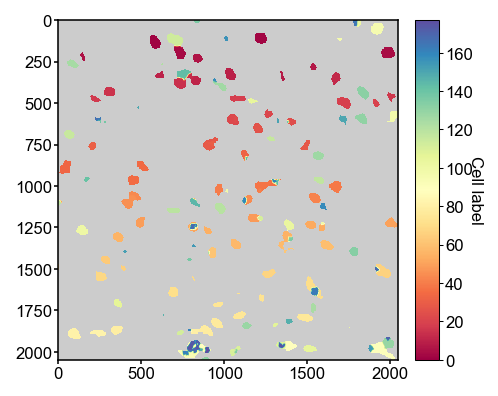

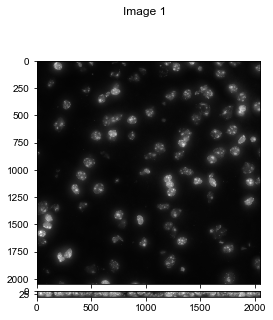

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_020_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_021.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_021.dax  in 3.724s
-- removing hot pixels for channels:['405'] in 3.166s
-- illumination correction for channels: 405, in 0.996s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.151s


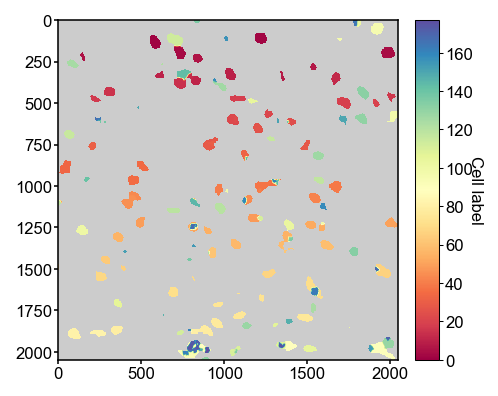

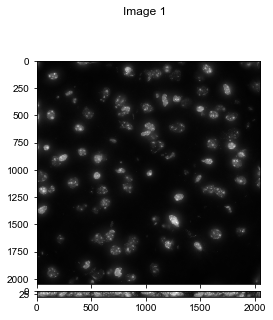

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_021_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_022.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_022.dax  in 4.791s
-- removing hot pixels for channels:['405'] in 3.096s
-- illumination correction for channels: 405, in 1.045s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.157s


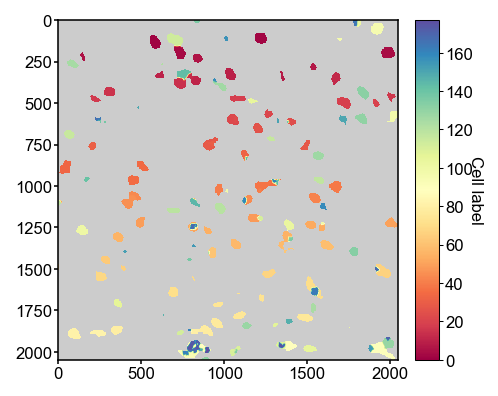

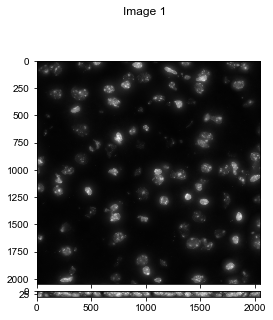

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_022_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_023.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_023.dax  in 3.468s
-- removing hot pixels for channels:['405'] in 3.094s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.828s


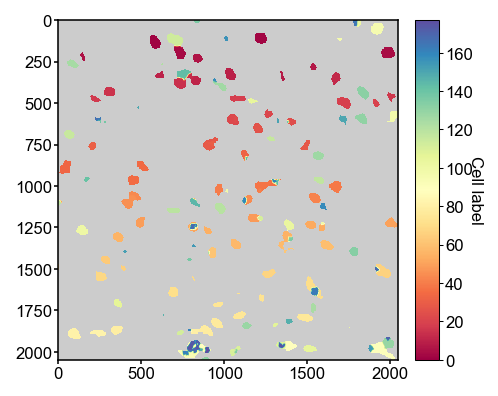

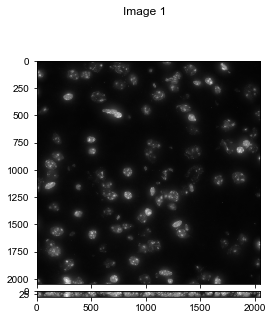

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_023_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_024.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_024.dax  in 3.272s
-- removing hot pixels for channels:['405'] in 3.106s
-- illumination correction for channels: 405, in 1.062s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.672s


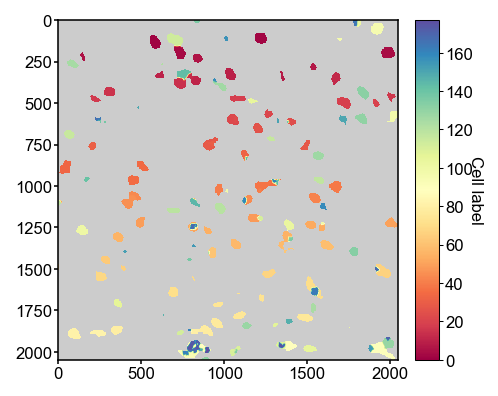

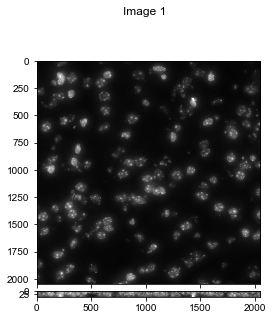

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_024_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_025.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_025.dax  in 4.069s
-- removing hot pixels for channels:['405'] in 3.172s
-- illumination correction for channels: 405, in 0.953s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.409s


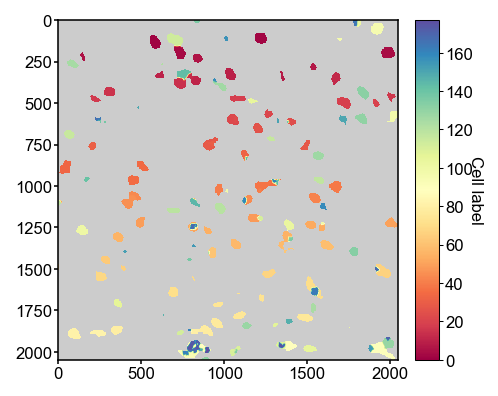

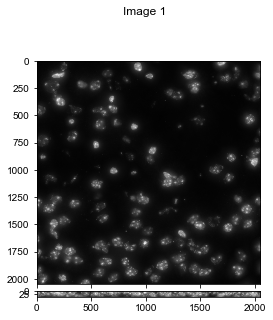

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_025_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_026.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_026.dax  in 3.482s
-- removing hot pixels for channels:['405'] in 3.140s
-- illumination correction for channels: 405, in 0.938s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.778s


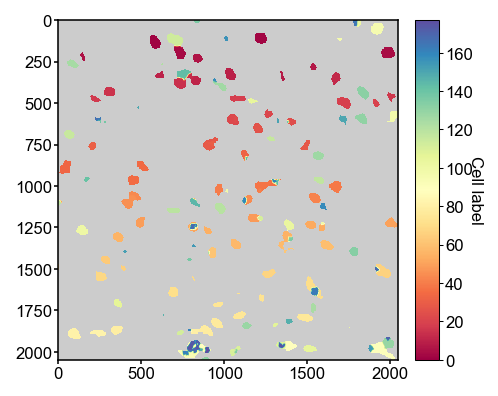

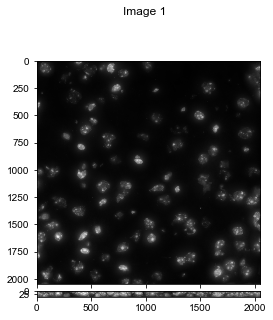

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_026_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_027.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_027.dax  in 3.225s
-- removing hot pixels for channels:['405'] in 3.141s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.625s


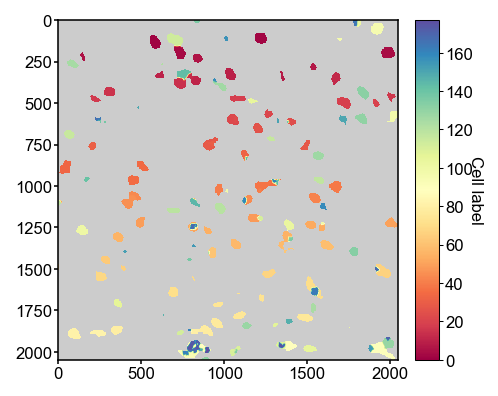

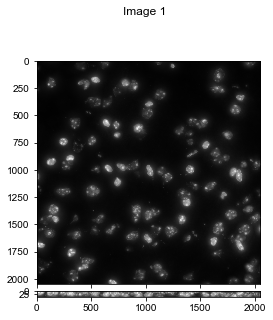

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_027_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_028.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_028.dax  in 5.293s
-- removing hot pixels for channels:['405'] in 3.110s
-- illumination correction for channels: 405, in 0.969s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.578s


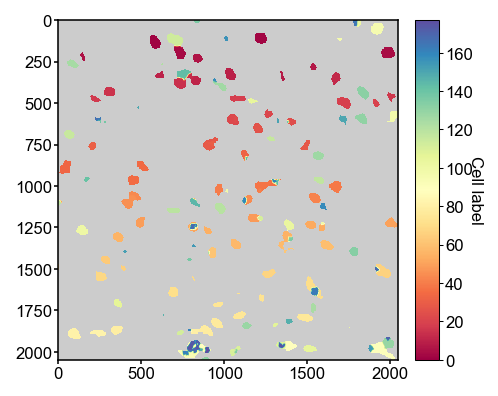

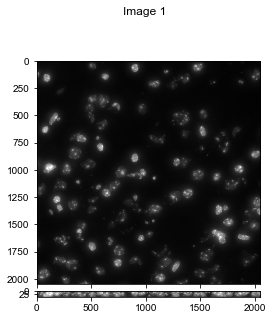

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_028_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_029.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_029.dax  in 3.391s
-- removing hot pixels for channels:['405'] in 3.094s
-- illumination correction for channels: 405, in 0.975s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.781s


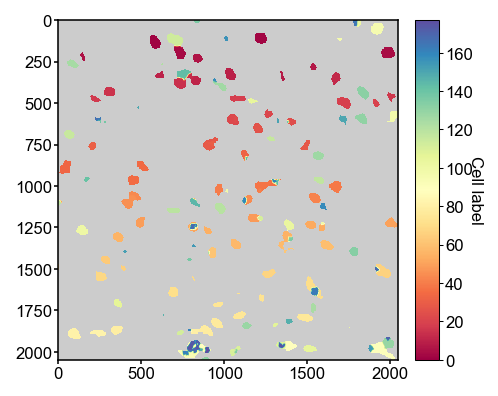

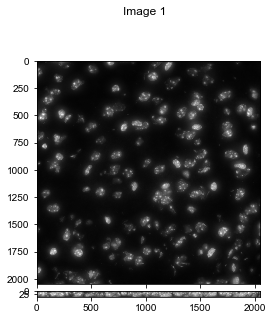

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_029_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_030.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_030.dax  in 4.343s
-- removing hot pixels for channels:['405'] in 3.078s
-- illumination correction for channels: 405, in 0.970s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.657s


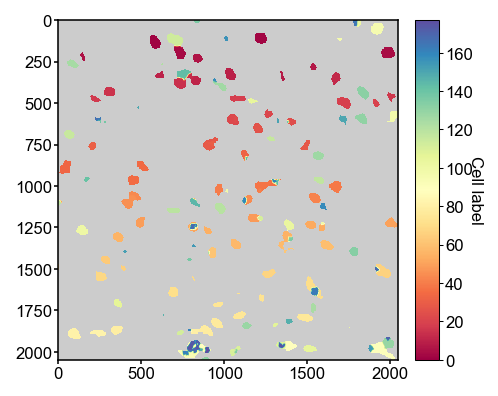

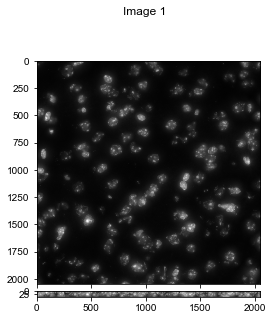

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_030_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_031.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_031.dax  in 4.030s
-- removing hot pixels for channels:['405'] in 3.016s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.344s


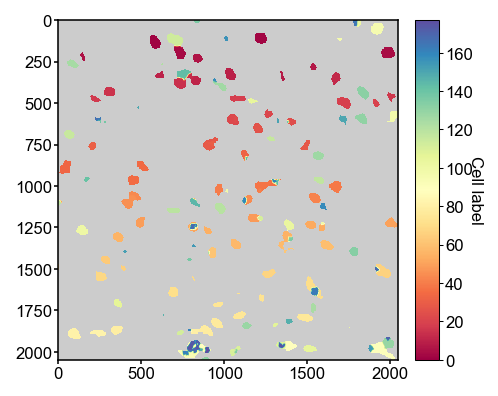

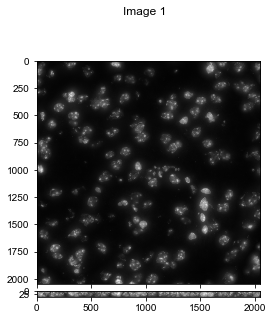

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_031_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_032.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_032.dax  in 3.179s
-- removing hot pixels for channels:['405'] in 2.969s
-- illumination correction for channels: 405, in 0.954s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.328s


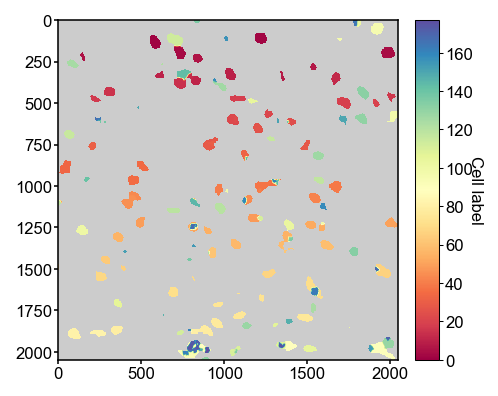

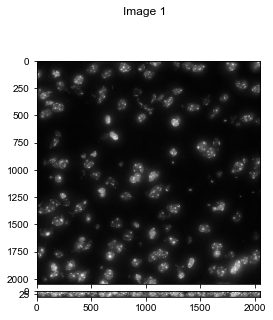

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_032_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_033.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_033.dax  in 3.884s
-- removing hot pixels for channels:['405'] in 3.046s
-- illumination correction for channels: 405, in 0.953s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.110s


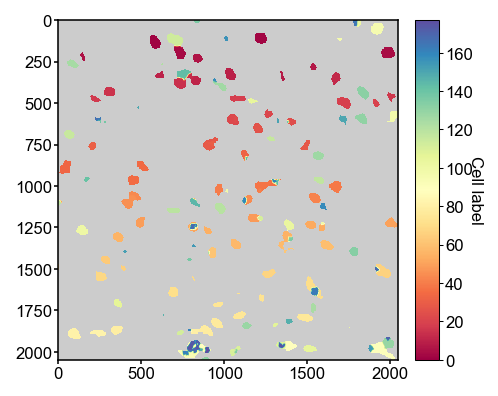

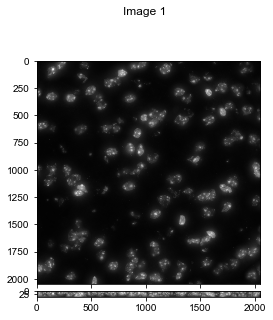

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_033_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_034.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_034.dax  in 3.243s
-- removing hot pixels for channels:['405'] in 2.969s
-- illumination correction for channels: 405, in 0.969s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.380s


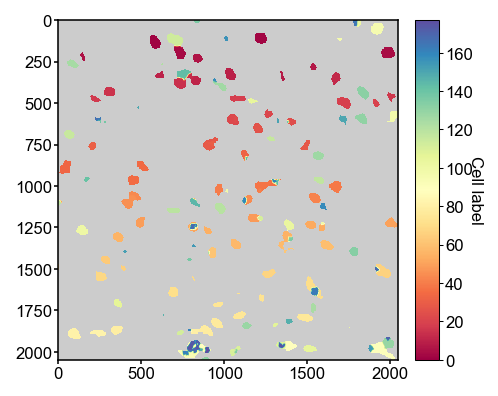

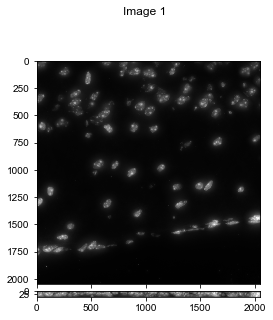

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_034_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_035.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_035.dax  in 4.185s
-- removing hot pixels for channels:['405'] in 2.984s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.423s


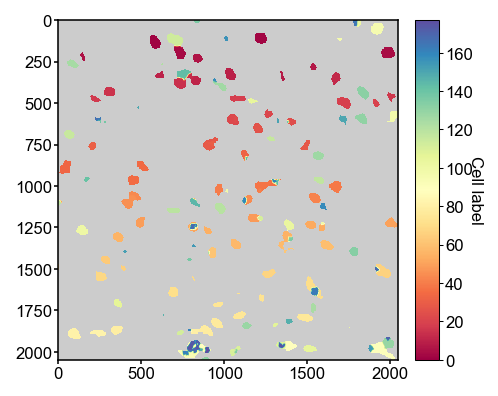

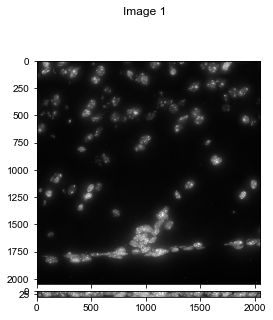

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_035_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_036.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_036.dax  in 4.405s
-- removing hot pixels for channels:['405'] in 3.031s
-- illumination correction for channels: 405, in 0.970s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.644s


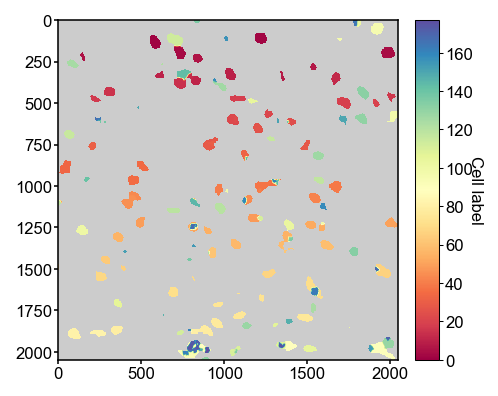

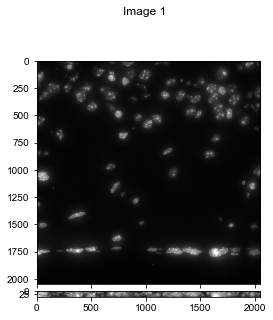

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_036_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_037.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_037.dax  in 4.376s
-- removing hot pixels for channels:['405'] in 3.094s
-- illumination correction for channels: 405, in 1.037s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.737s


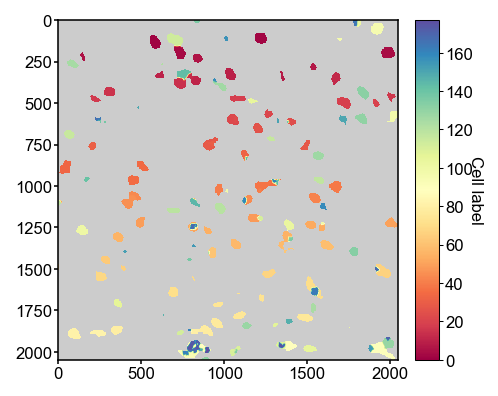

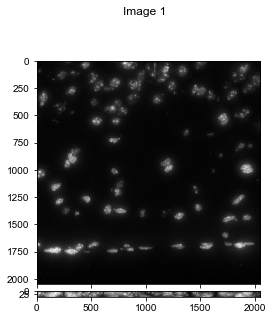

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_037_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_038.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_038.dax  in 4.980s
-- removing hot pixels for channels:['405'] in 3.164s
-- illumination correction for channels: 405, in 0.936s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.294s


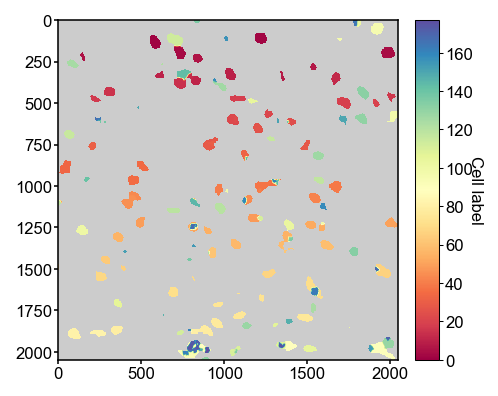

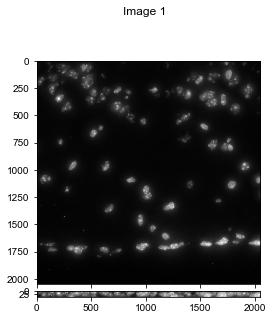

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_038_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_039.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_039.dax  in 4.109s
-- removing hot pixels for channels:['405'] in 3.000s
-- illumination correction for channels: 405, in 0.984s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.454s


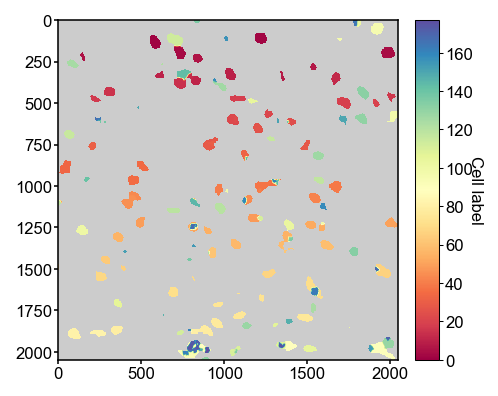

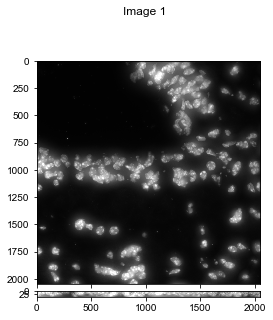

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_039_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_040.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_040.dax  in 4.764s
-- removing hot pixels for channels:['405'] in 3.016s
-- illumination correction for channels: 405, in 1.029s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.078s


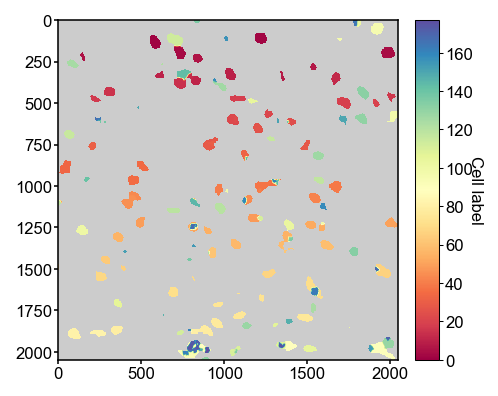

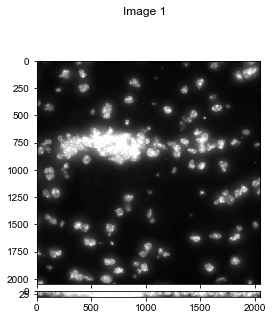

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_040_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_041.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_041.dax  in 4.211s
-- removing hot pixels for channels:['405'] in 3.001s
-- illumination correction for channels: 405, in 0.968s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.391s


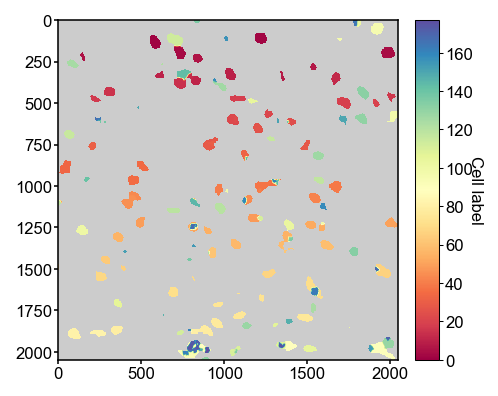

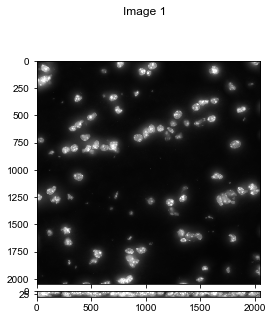

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_041_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_042.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_042.dax  in 5.425s
-- removing hot pixels for channels:['405'] in 3.495s
-- illumination correction for channels: 405, in 1.140s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.313s


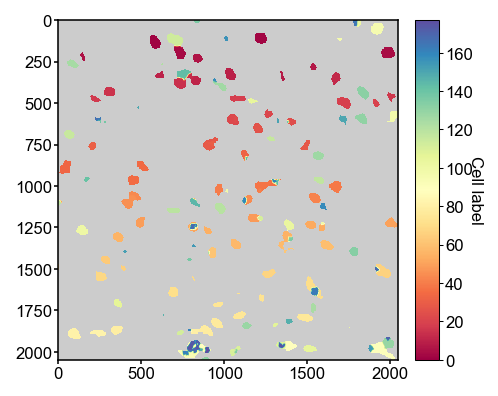

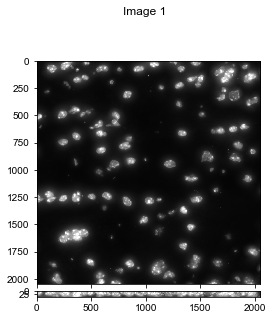

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_042_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_043.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_043.dax  in 4.032s
-- removing hot pixels for channels:['405'] in 3.425s
-- illumination correction for channels: 405, in 1.044s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.797s


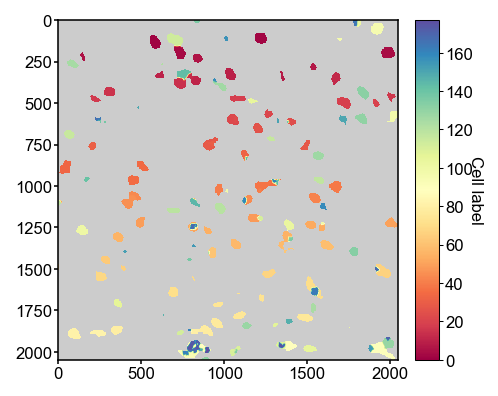

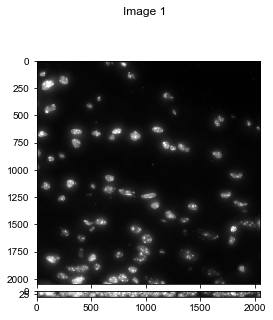

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_043_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_044.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_044.dax  in 5.106s
-- removing hot pixels for channels:['405'] in 3.250s
-- illumination correction for channels: 405, in 1.000s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.562s


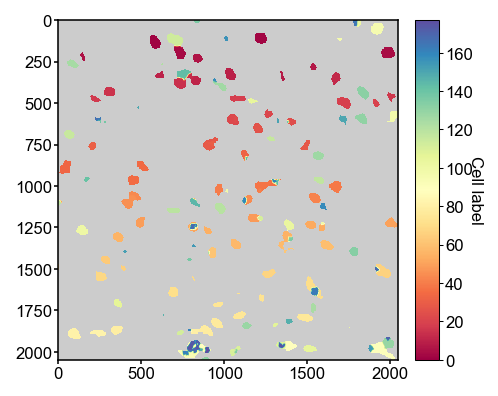

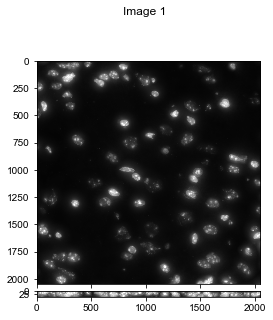

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_044_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_045.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_045.dax  in 4.184s
-- removing hot pixels for channels:['405'] in 3.359s
-- illumination correction for channels: 405, in 1.094s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.875s


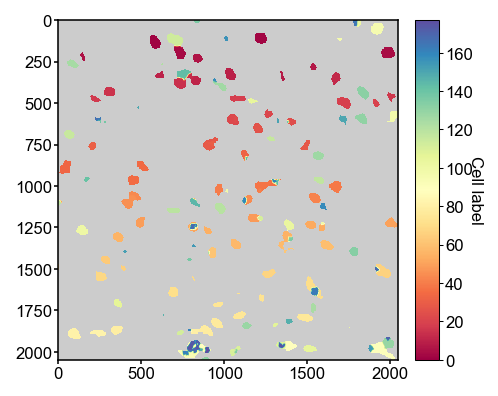

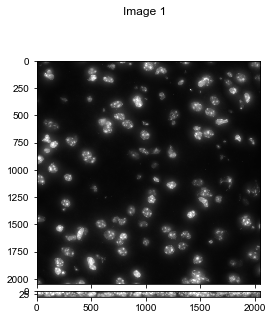

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_045_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_046.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_046.dax  in 5.071s
-- removing hot pixels for channels:['405'] in 3.226s
-- illumination correction for channels: 405, in 1.033s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.688s


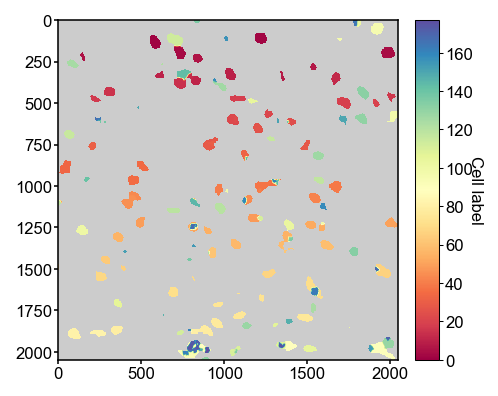

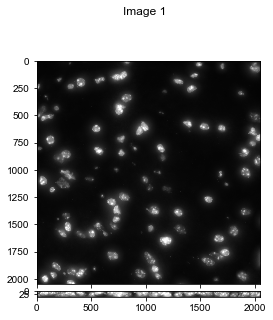

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_046_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_047.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_047.dax  in 3.747s
-- removing hot pixels for channels:['405'] in 3.218s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.267s


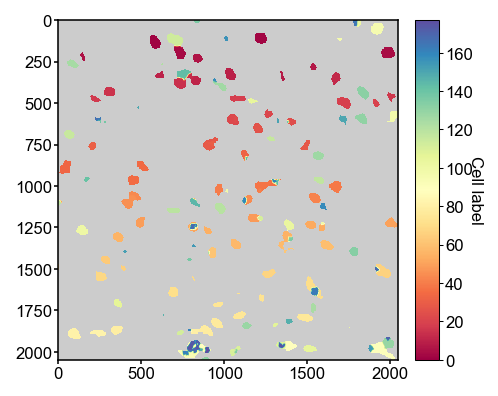

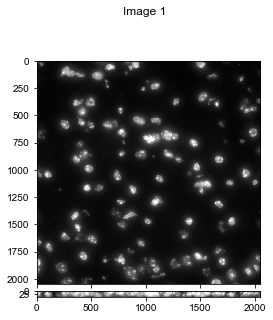

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_047_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_048.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_048.dax  in 5.442s
-- removing hot pixels for channels:['405'] in 3.171s
-- illumination correction for channels: 405, in 1.020s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.854s


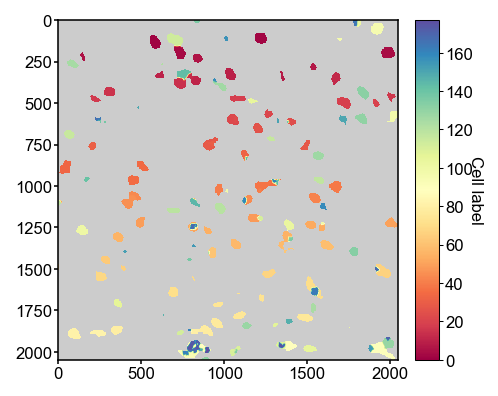

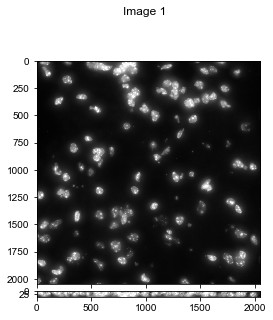

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_048_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_049.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_049.dax  in 4.433s
-- removing hot pixels for channels:['405'] in 3.266s
-- illumination correction for channels: 405, in 1.047s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.025s


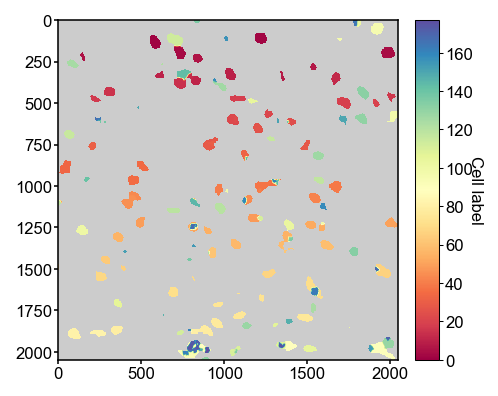

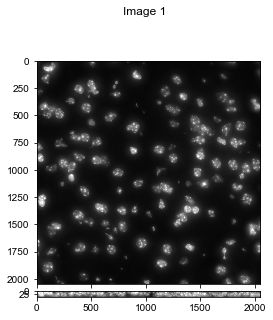

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_049_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_050.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_050.dax  in 5.203s
-- removing hot pixels for channels:['405'] in 3.219s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.701s


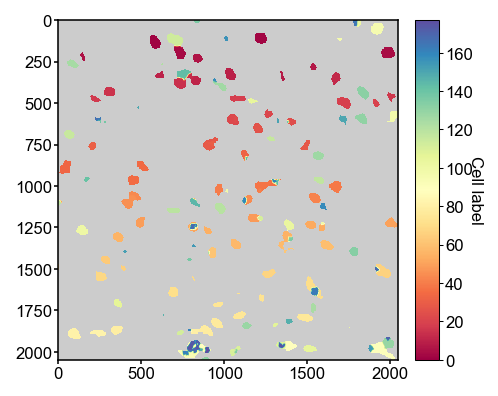

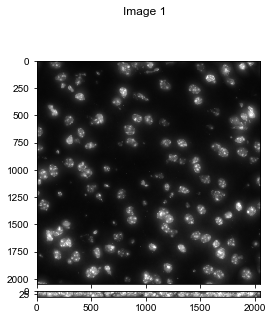

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_050_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_051.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_051.dax  in 3.394s
-- removing hot pixels for channels:['405'] in 3.235s
-- illumination correction for channels: 405, in 1.062s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.922s


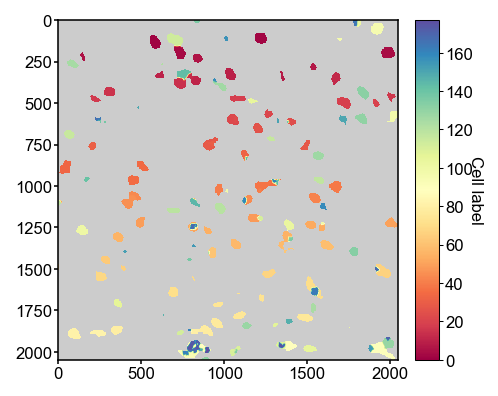

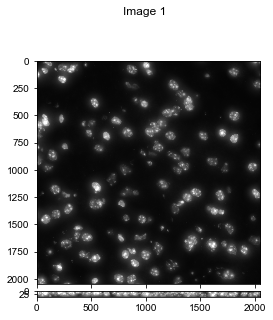

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_051_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_052.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_052.dax  in 5.124s
-- removing hot pixels for channels:['405'] in 3.281s
-- illumination correction for channels: 405, in 1.109s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.740s


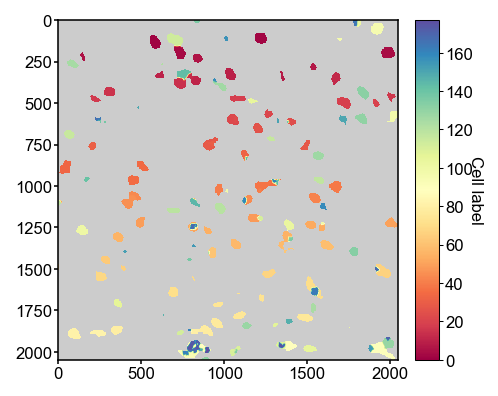

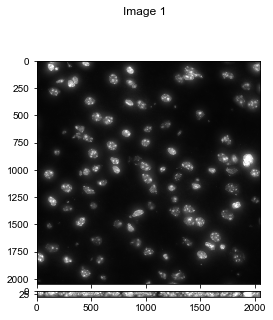

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_052_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_053.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_053.dax  in 3.469s
-- removing hot pixels for channels:['405'] in 3.219s
-- illumination correction for channels: 405, in 1.059s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.047s


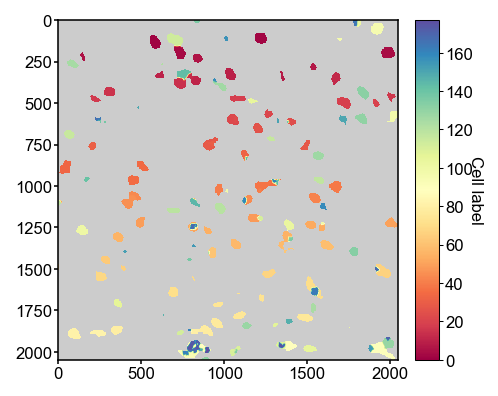

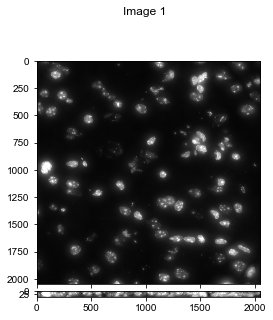

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_053_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_054.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_054.dax  in 4.423s
-- removing hot pixels for channels:['405'] in 3.234s
-- illumination correction for channels: 405, in 0.984s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.870s


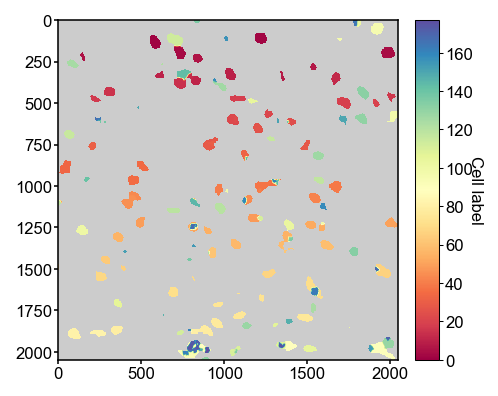

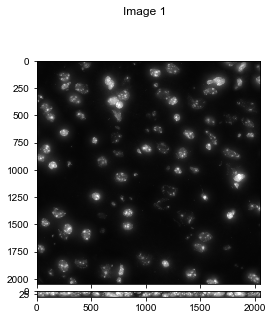

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_054_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_055.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_055.dax  in 3.301s
-- removing hot pixels for channels:['405'] in 3.188s
-- illumination correction for channels: 405, in 1.000s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.706s


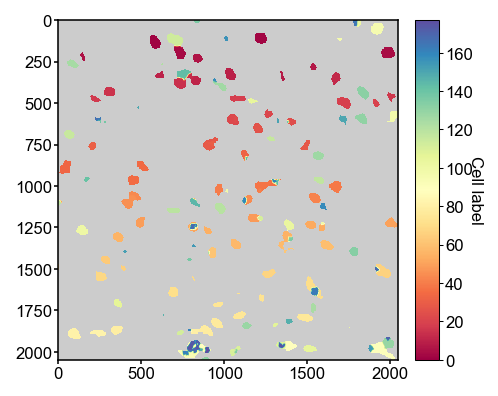

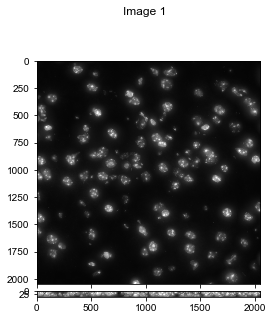

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_055_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_056.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_056.dax  in 5.213s
-- removing hot pixels for channels:['405'] in 3.156s
-- illumination correction for channels: 405, in 1.047s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.641s


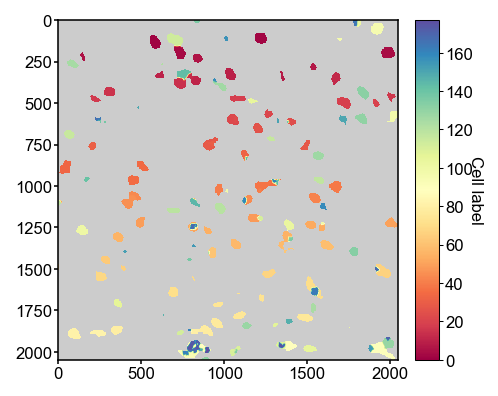

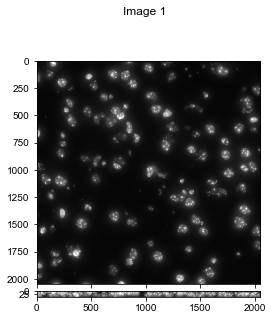

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_056_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_057.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_057.dax  in 3.934s
-- removing hot pixels for channels:['405'] in 3.344s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.508s


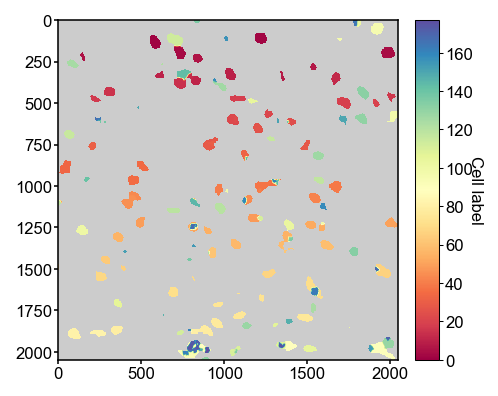

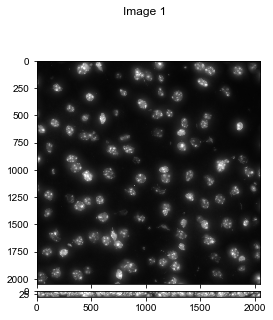

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_057_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_058.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_058.dax  in 5.352s
-- removing hot pixels for channels:['405'] in 3.119s
-- illumination correction for channels: 405, in 1.022s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.844s


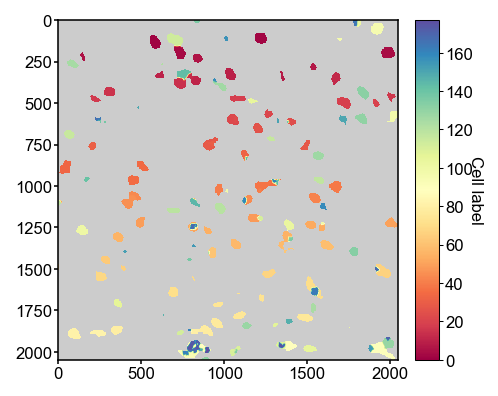

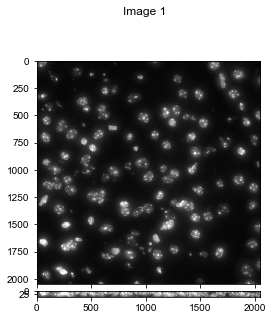

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_058_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_059.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_059.dax  in 4.249s
-- removing hot pixels for channels:['405'] in 3.156s
-- illumination correction for channels: 405, in 1.048s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.719s


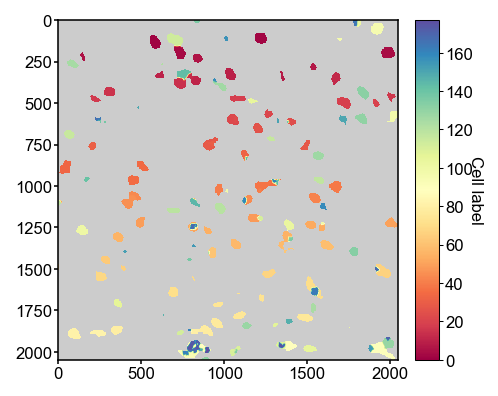

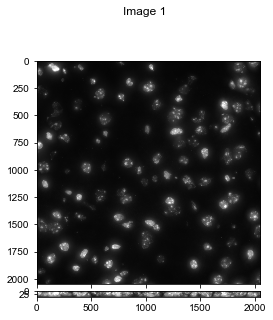

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_059_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_060.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_060.dax  in 5.453s
-- removing hot pixels for channels:['405'] in 3.250s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.954s


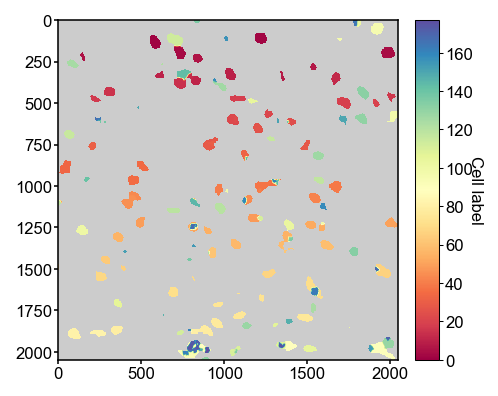

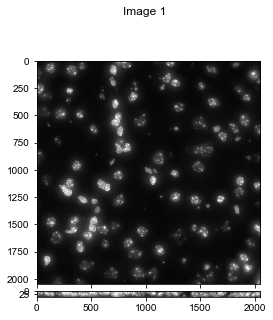

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_060_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_061.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_061.dax  in 4.153s
-- removing hot pixels for channels:['405'] in 3.234s
-- illumination correction for channels: 405, in 0.987s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.662s


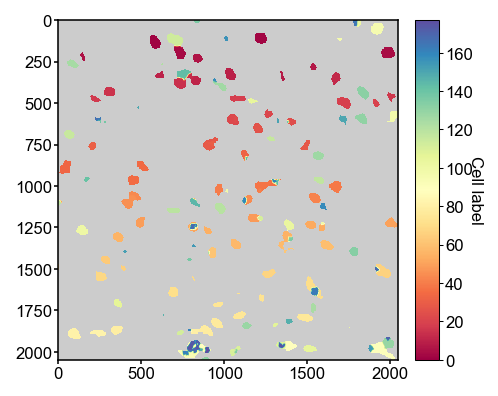

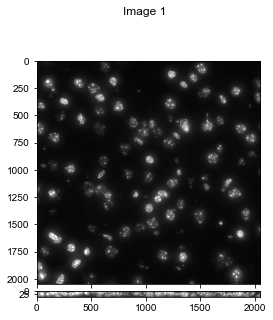

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_061_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_062.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_062.dax  in 5.051s
-- removing hot pixels for channels:['405'] in 3.183s
-- illumination correction for channels: 405, in 1.014s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.522s


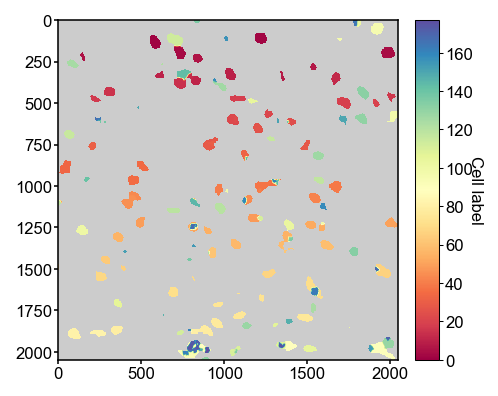

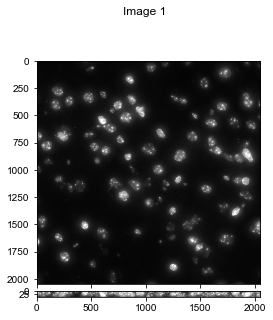

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_062_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_063.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_063.dax  in 4.167s
-- removing hot pixels for channels:['405'] in 3.279s
-- illumination correction for channels: 405, in 1.063s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.783s


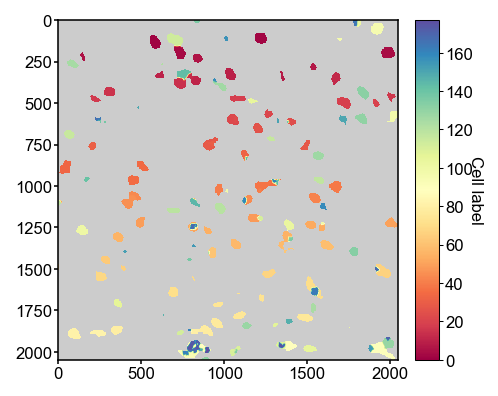

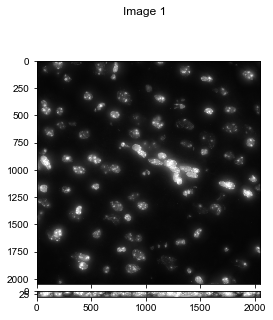

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_063_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_064.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_064.dax  in 5.269s
-- removing hot pixels for channels:['405'] in 3.327s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.826s


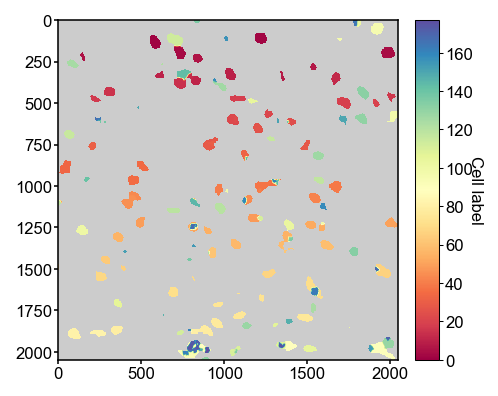

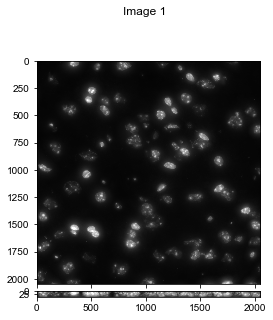

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_064_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_065.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_065.dax  in 5.373s
-- removing hot pixels for channels:['405'] in 3.297s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.981s


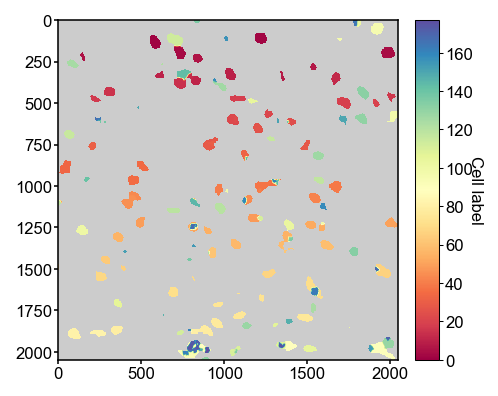

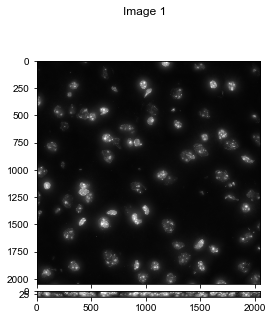

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_065_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_066.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_066.dax  in 6.794s
-- removing hot pixels for channels:['405'] in 3.208s
-- illumination correction for channels: 405, in 1.027s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 11.312s


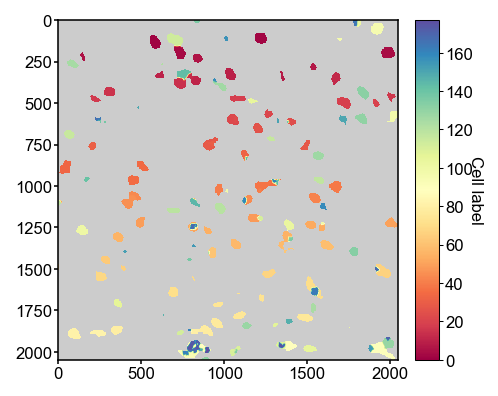

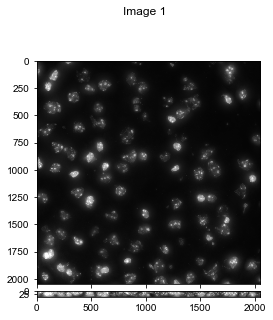

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_066_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_067.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_067.dax  in 7.020s
-- removing hot pixels for channels:['405'] in 3.250s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 11.557s


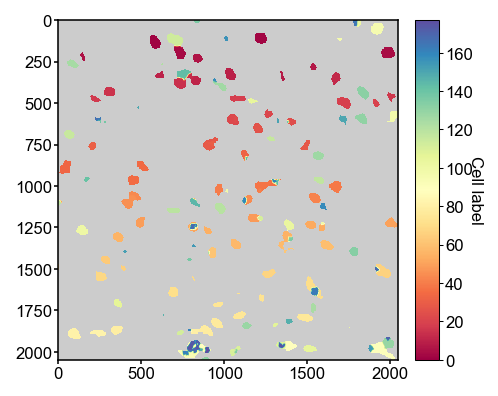

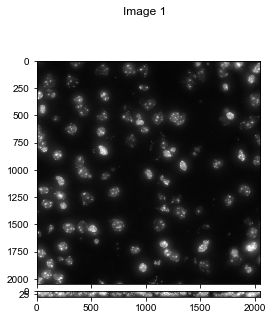

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_067_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_068.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_068.dax  in 6.842s
-- removing hot pixels for channels:['405'] in 3.183s
-- illumination correction for channels: 405, in 1.100s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 11.503s


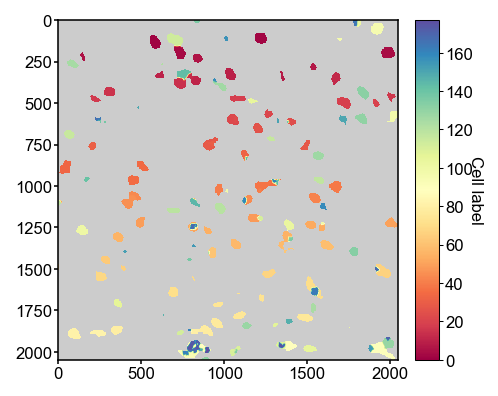

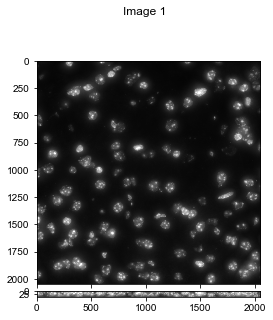

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_068_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_069.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_069.dax  in 4.469s
-- removing hot pixels for channels:['405'] in 3.281s
-- illumination correction for channels: 405, in 1.047s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.066s


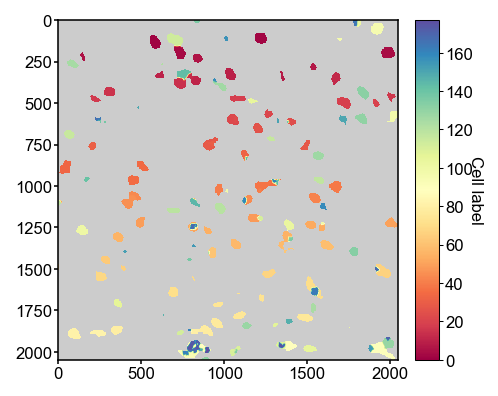

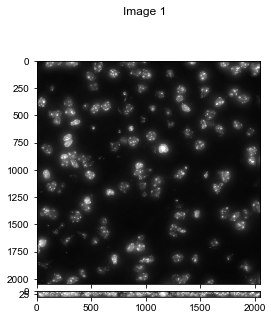

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_069_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_070.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_070.dax  in 6.258s
-- removing hot pixels for channels:['405'] in 3.225s
-- illumination correction for channels: 405, in 1.025s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.831s


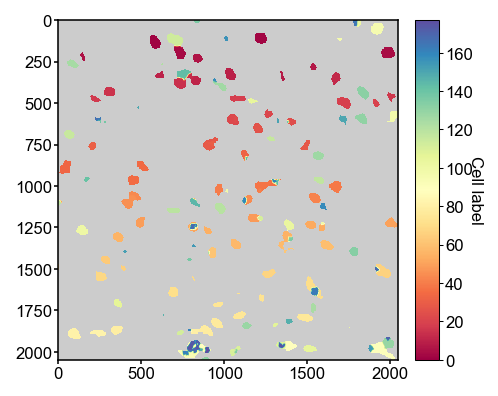

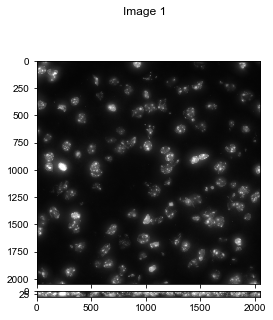

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_070_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_071.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_071.dax  in 3.874s
-- removing hot pixels for channels:['405'] in 3.391s
-- illumination correction for channels: 405, in 1.032s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.609s


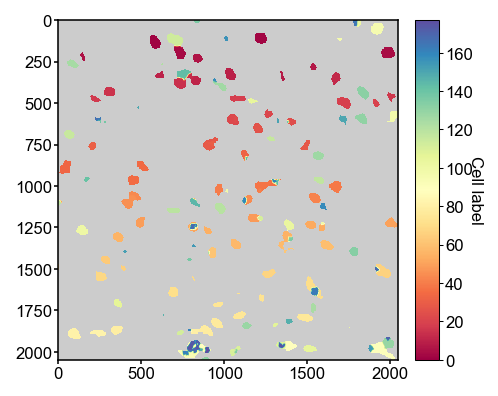

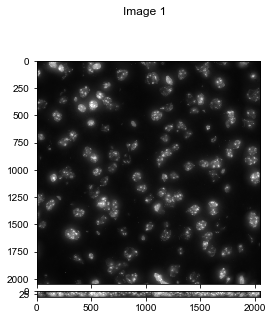

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_071_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_072.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_072.dax  in 5.641s
-- removing hot pixels for channels:['405'] in 3.250s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.174s


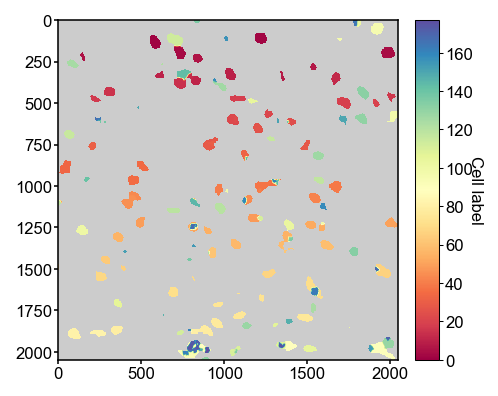

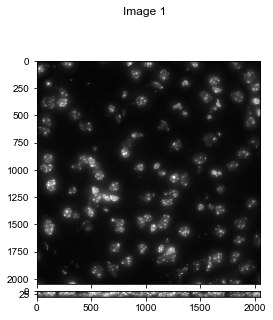

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_072_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_073.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_073.dax  in 4.170s
-- removing hot pixels for channels:['405'] in 3.285s
-- illumination correction for channels: 405, in 0.996s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.719s


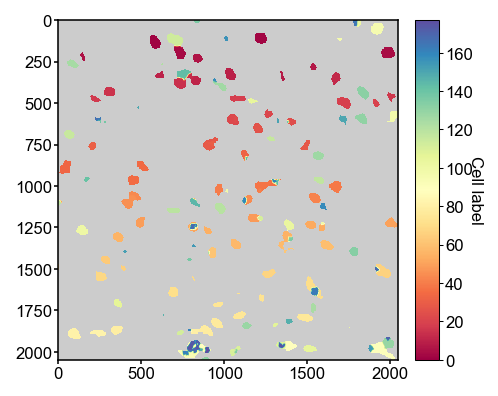

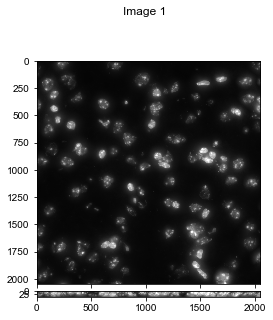

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_073_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_074.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_074.dax  in 4.797s
-- removing hot pixels for channels:['405'] in 3.282s
-- illumination correction for channels: 405, in 1.028s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.313s


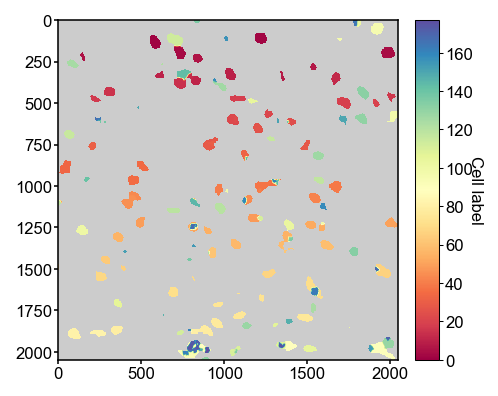

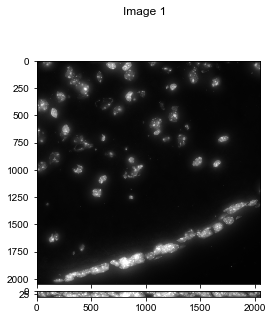

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_074_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_075.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_075.dax  in 3.280s
-- removing hot pixels for channels:['405'] in 3.203s
-- illumination correction for channels: 405, in 1.047s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.796s


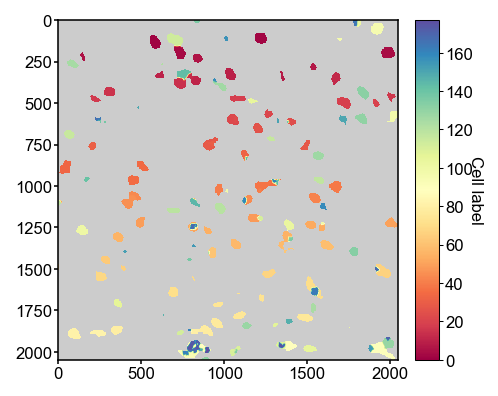

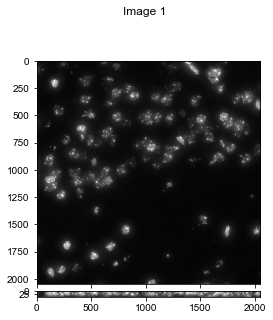

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_075_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_076.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_076.dax  in 4.318s
-- removing hot pixels for channels:['405'] in 3.235s
-- illumination correction for channels: 405, in 1.063s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.944s


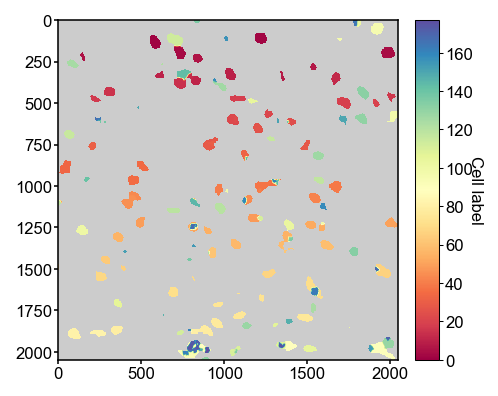

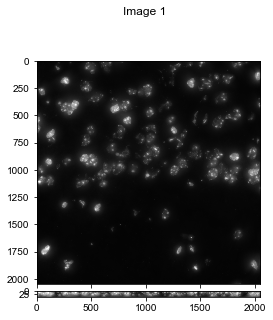

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_076_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_077.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_077.dax  in 4.140s
-- removing hot pixels for channels:['405'] in 3.203s
-- illumination correction for channels: 405, in 1.016s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.623s


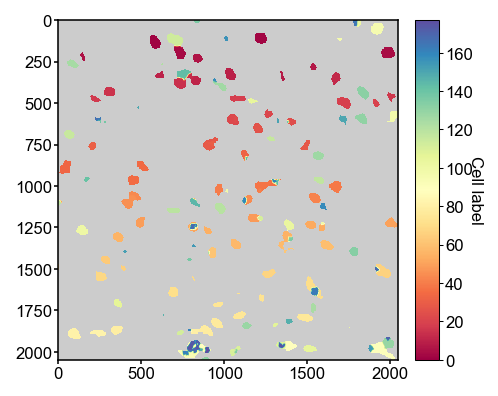

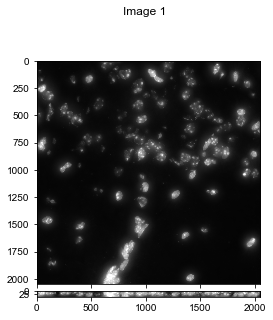

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_077_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_078.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_078.dax  in 6.171s
-- removing hot pixels for channels:['405'] in 3.172s
-- illumination correction for channels: 405, in 1.017s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.578s


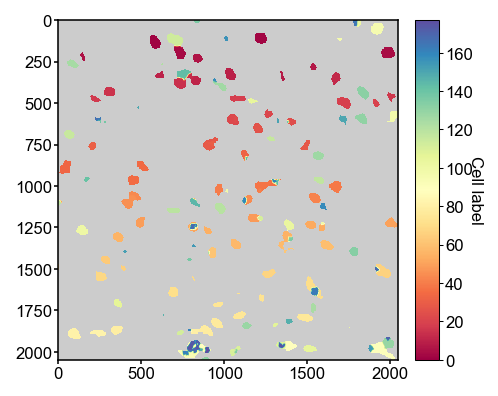

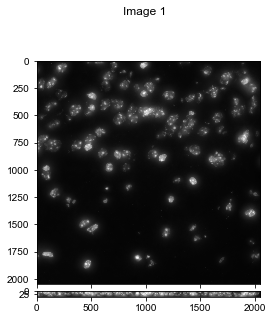

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_078_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_079.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_079.dax  in 3.831s
-- removing hot pixels for channels:['405'] in 3.311s
-- illumination correction for channels: 405, in 0.982s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.341s


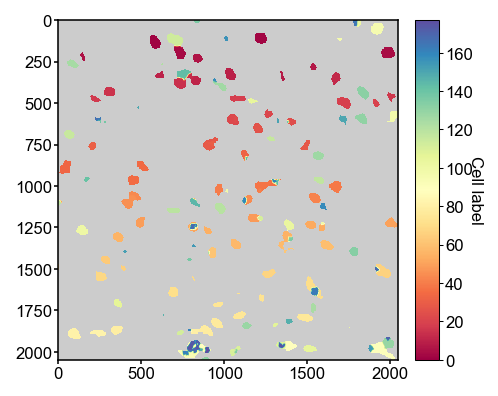

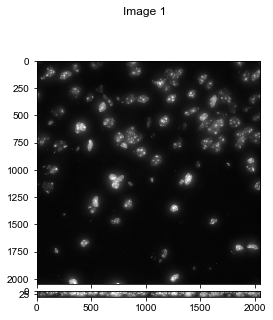

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_079_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_080.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_080.dax  in 6.303s
-- removing hot pixels for channels:['405'] in 3.307s
-- illumination correction for channels: 405, in 1.080s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.984s


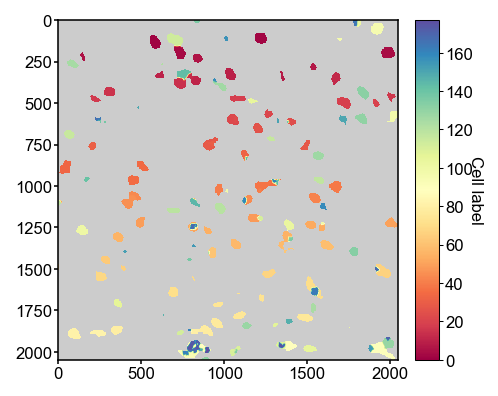

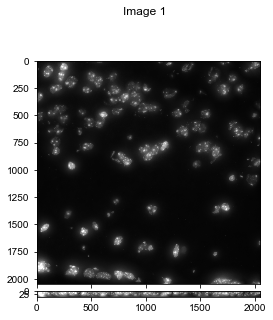

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_080_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_081.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_081.dax  in 4.719s
-- removing hot pixels for channels:['405'] in 3.257s
-- illumination correction for channels: 405, in 1.009s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.297s


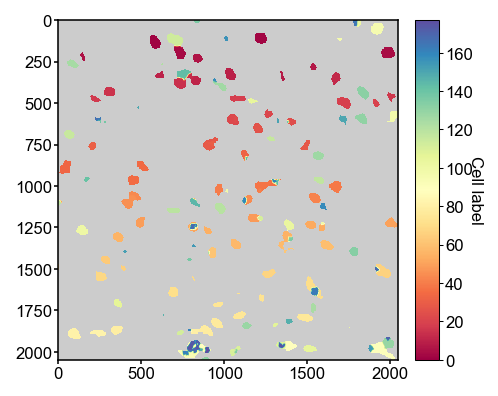

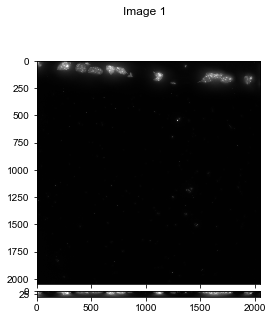

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_081_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_082.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_082.dax  in 4.953s
-- removing hot pixels for channels:['405'] in 3.187s
-- illumination correction for channels: 405, in 1.000s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.360s


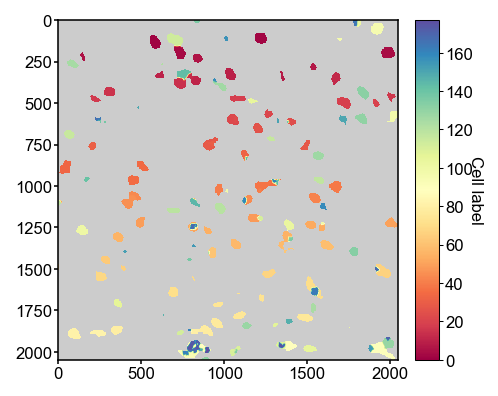

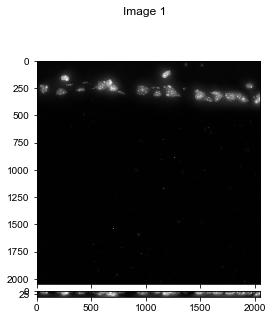

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_082_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_083.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_083.dax  in 3.587s
-- removing hot pixels for channels:['405'] in 3.246s
-- illumination correction for channels: 405, in 1.031s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.188s


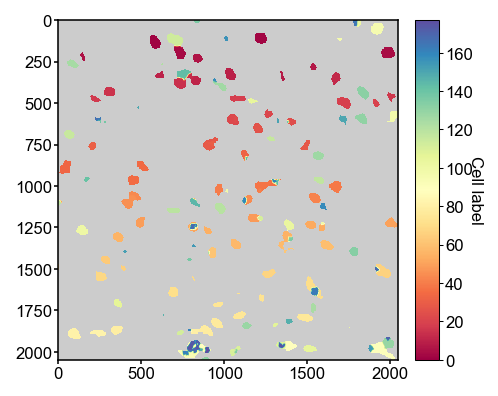

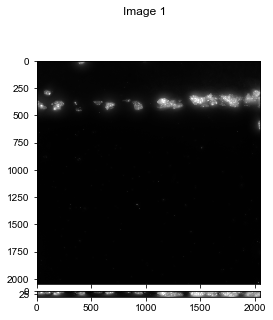

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_083_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_084.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_084.dax  in 5.969s
-- removing hot pixels for channels:['405'] in 3.203s
-- illumination correction for channels: 405, in 1.000s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.374s


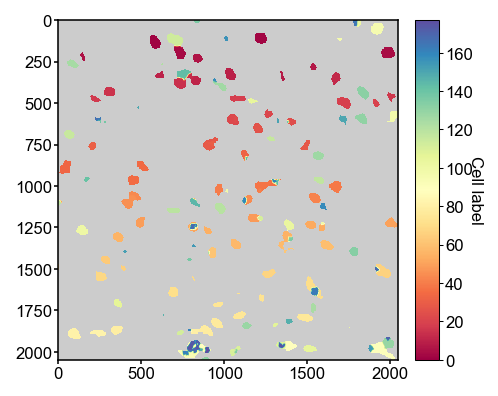

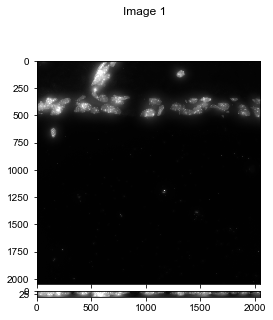

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_084_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_085.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_085.dax  in 3.870s
-- removing hot pixels for channels:['405'] in 3.316s
-- illumination correction for channels: 405, in 0.997s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.453s


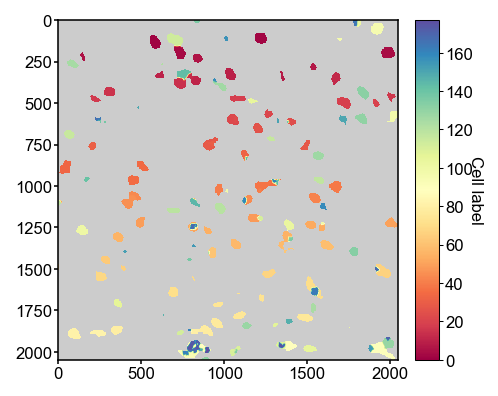

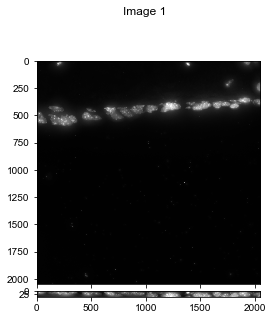

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_085_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_086.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_086.dax  in 4.791s
-- removing hot pixels for channels:['405'] in 3.110s
-- illumination correction for channels: 405, in 1.000s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.249s


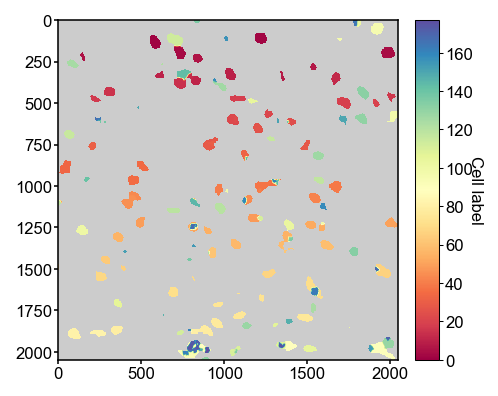

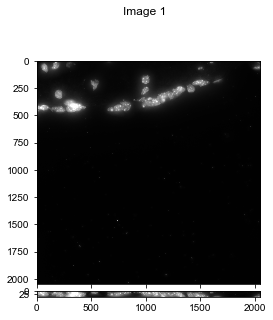

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_086_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_087.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_087.dax  in 4.375s
-- removing hot pixels for channels:['405'] in 3.242s
-- illumination correction for channels: 405, in 1.008s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.871s


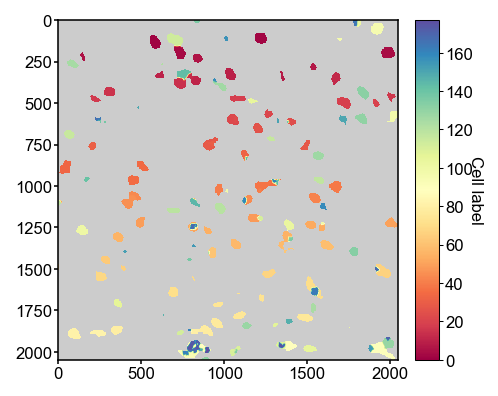

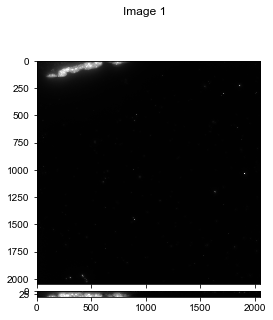

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_087_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_088.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_088.dax  in 5.846s
-- removing hot pixels for channels:['405'] in 3.312s
-- illumination correction for channels: 405, in 1.110s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.514s


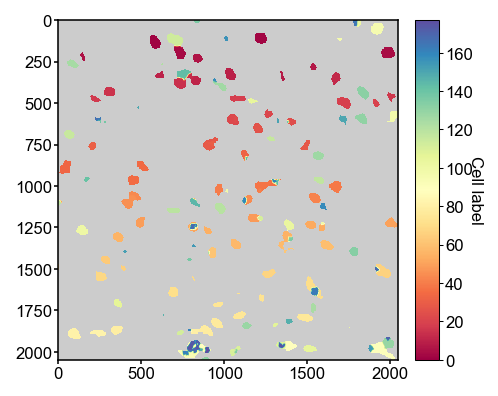

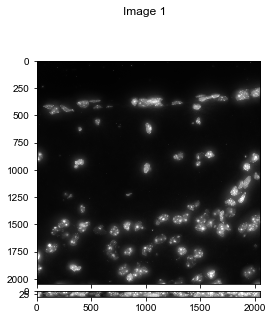

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_088_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_089.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_089.dax  in 3.469s
-- removing hot pixels for channels:['405'] in 3.203s
-- illumination correction for channels: 405, in 1.047s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.000s


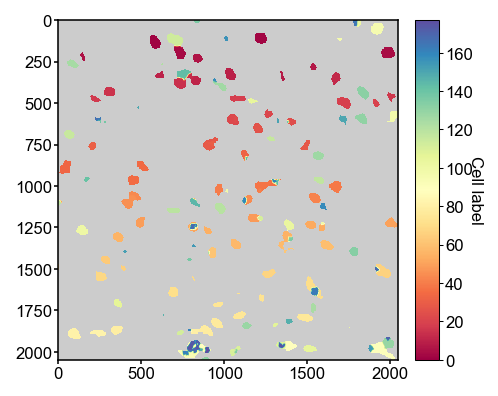

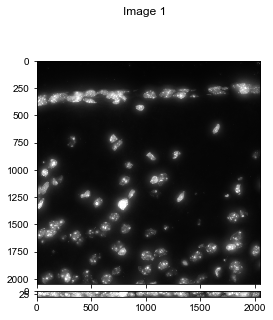

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_089_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_090.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_090.dax  in 6.208s
-- removing hot pixels for channels:['405'] in 3.260s
-- illumination correction for channels: 405, in 0.985s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.672s


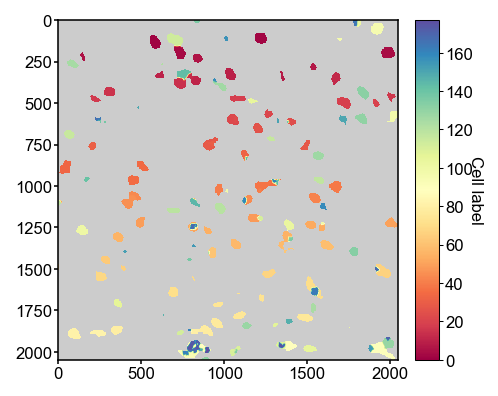

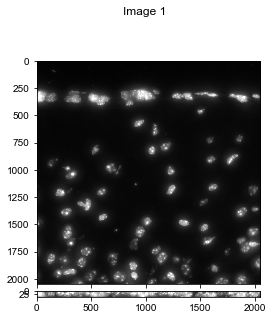

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_090_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_091.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_091.dax  in 4.126s
-- removing hot pixels for channels:['405'] in 3.296s
-- illumination correction for channels: 405, in 1.047s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.792s


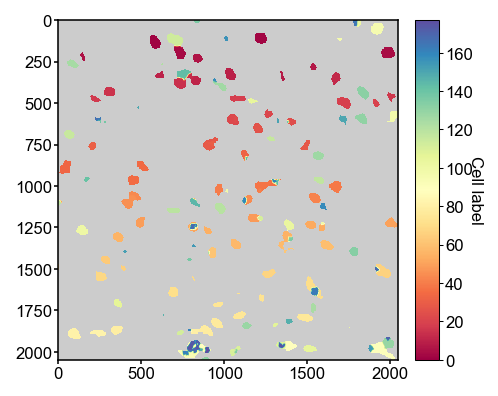

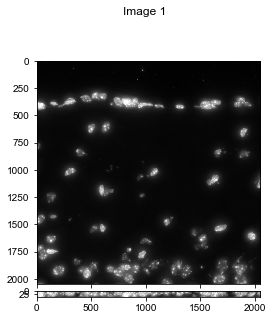

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_091_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_092.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_092.dax  in 5.328s
-- removing hot pixels for channels:['405'] in 3.140s
-- illumination correction for channels: 405, in 1.018s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.768s


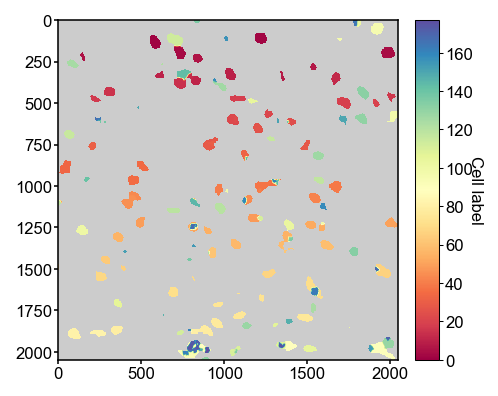

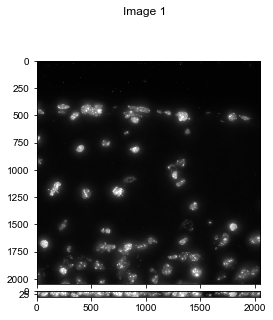

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_092_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_093.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_093.dax  in 3.954s
-- removing hot pixels for channels:['405'] in 3.281s
-- illumination correction for channels: 405, in 0.981s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.432s


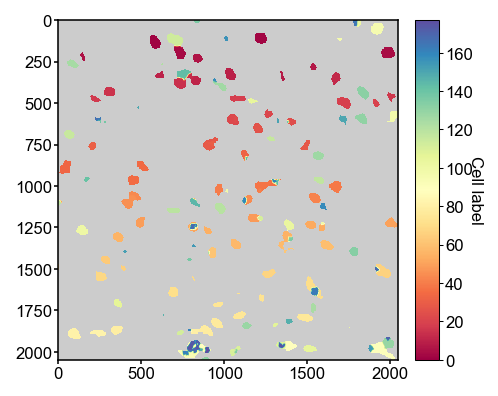

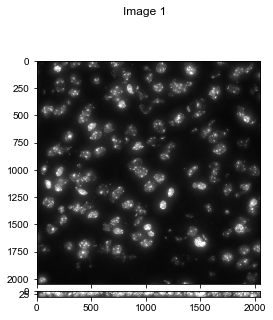

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_093_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_094.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_094.dax  in 3.811s
-- removing hot pixels for channels:['405'] in 3.304s
-- illumination correction for channels: 405, in 0.989s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.309s


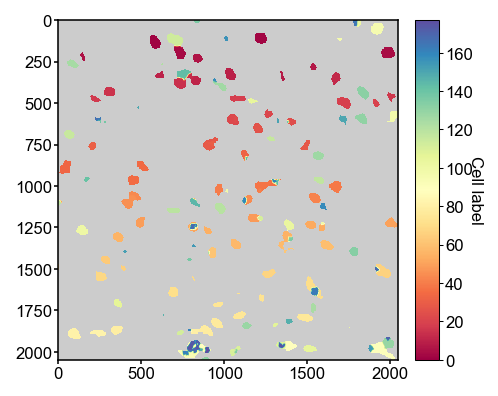

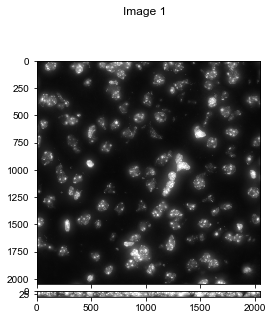

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_094_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_095.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_095.dax  in 4.015s
-- removing hot pixels for channels:['405'] in 3.253s
-- illumination correction for channels: 405, in 1.001s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.505s


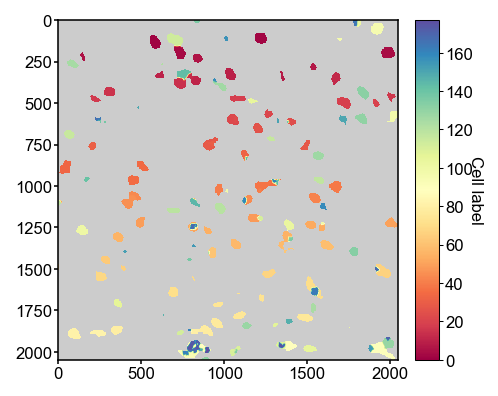

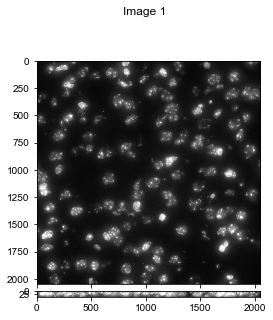

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_095_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_096.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_096.dax  in 5.267s
-- removing hot pixels for channels:['405'] in 3.105s
-- illumination correction for channels: 405, in 0.999s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.672s


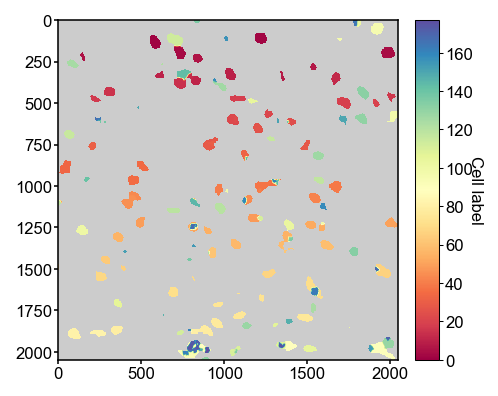

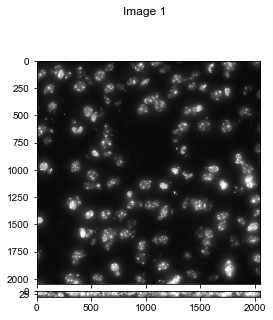

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_096_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_097.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_097.dax  in 4.255s
-- removing hot pixels for channels:['405'] in 3.266s
-- illumination correction for channels: 405, in 1.029s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.744s


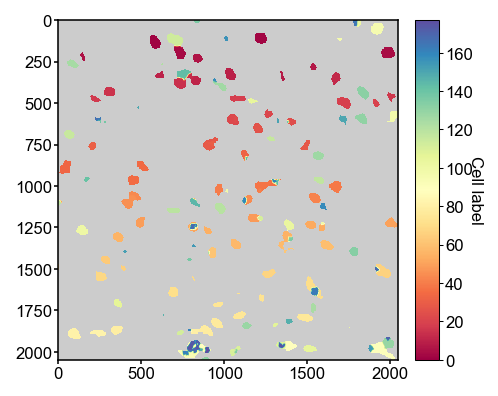

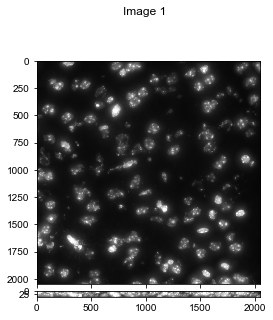

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_097_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_098.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_098.dax  in 5.162s
-- removing hot pixels for channels:['405'] in 3.225s
-- illumination correction for channels: 405, in 0.957s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.579s


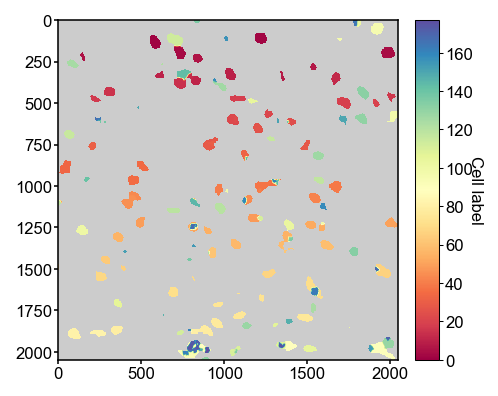

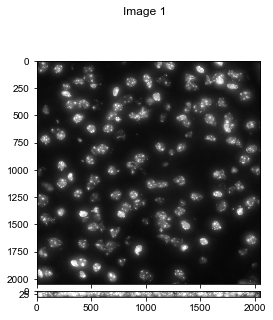

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_098_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_099.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_099.dax  in 4.100s
-- removing hot pixels for channels:['405'] in 3.136s
-- illumination correction for channels: 405, in 0.975s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.450s


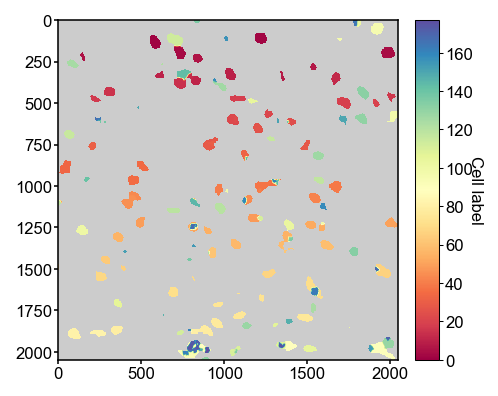

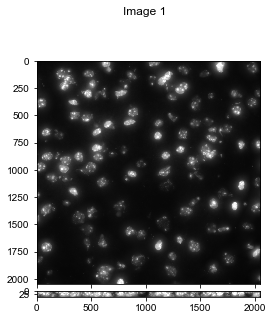

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_099_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_100.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_100.dax  in 5.230s
-- removing hot pixels for channels:['405'] in 2.921s
-- illumination correction for channels: 405, in 0.972s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.377s


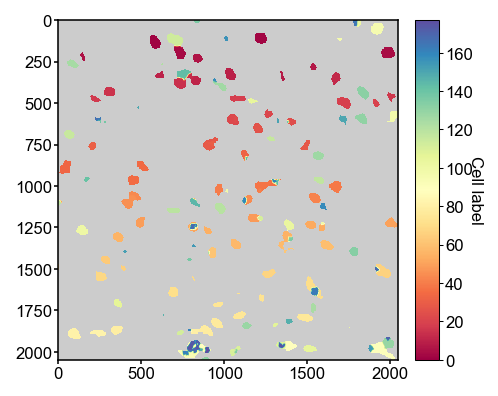

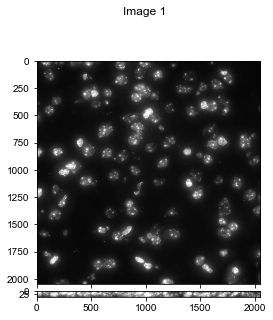

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_100_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_101.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_101.dax  in 3.194s
-- removing hot pixels for channels:['405'] in 3.081s
-- illumination correction for channels: 405, in 0.910s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.398s


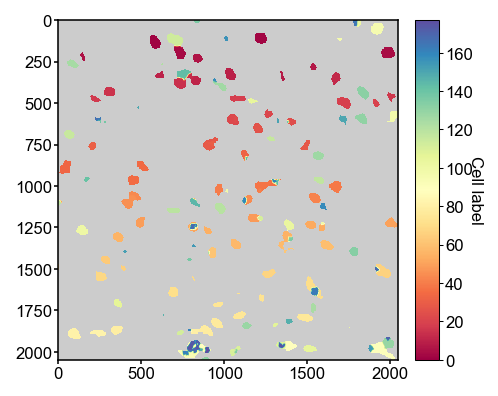

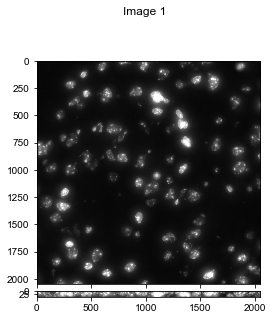

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_101_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_102.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_102.dax  in 4.145s
-- removing hot pixels for channels:['405'] in 2.958s
-- illumination correction for channels: 405, in 0.968s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.284s


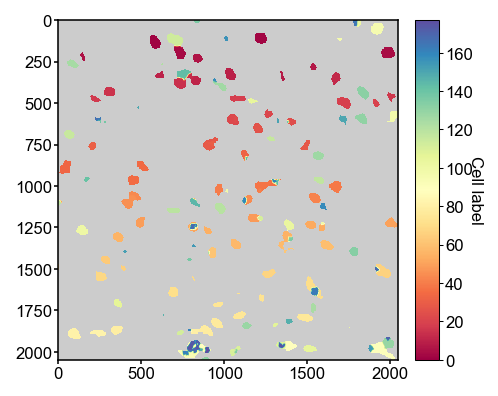

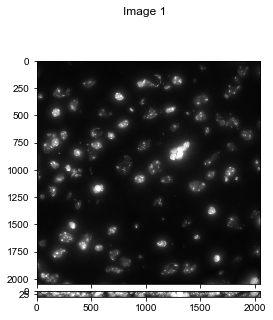

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_102_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_103.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_103.dax  in 3.426s
-- removing hot pixels for channels:['405'] in 2.936s
-- illumination correction for channels: 405, in 0.937s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.495s


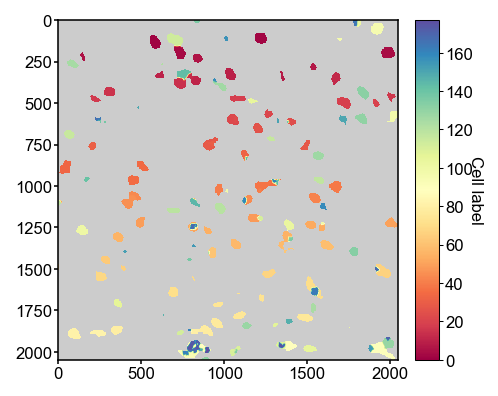

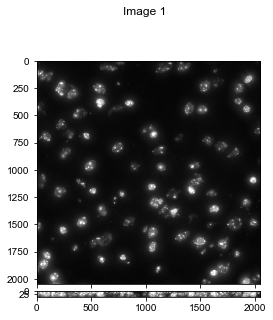

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_103_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_104.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_104.dax  in 4.918s
-- removing hot pixels for channels:['405'] in 2.951s
-- illumination correction for channels: 405, in 0.985s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.111s


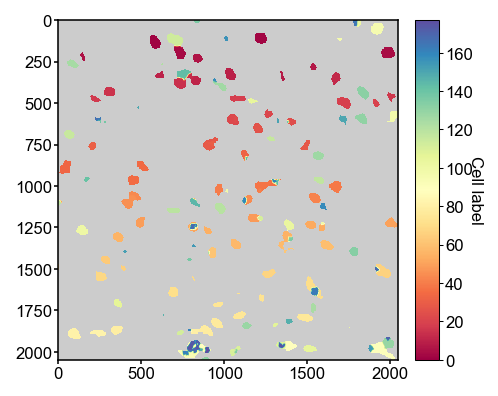

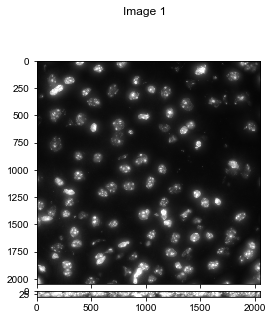

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_104_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_105.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_105.dax  in 4.074s
-- removing hot pixels for channels:['405'] in 2.991s
-- illumination correction for channels: 405, in 0.988s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.262s


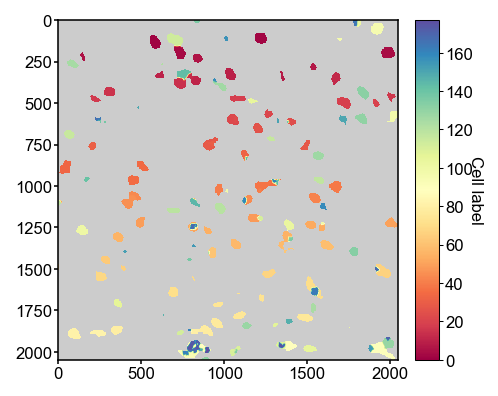

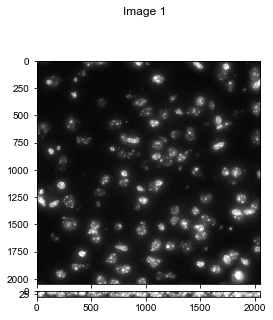

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_105_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_106.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_106.dax  in 3.121s
-- removing hot pixels for channels:['405'] in 3.053s
-- illumination correction for channels: 405, in 0.984s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.370s


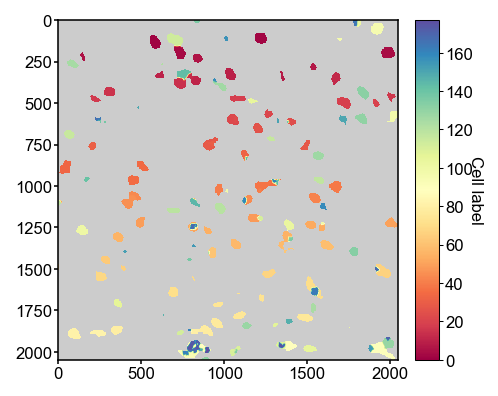

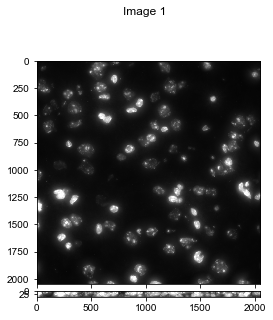

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_106_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_107.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_107.dax  in 3.928s
-- removing hot pixels for channels:['405'] in 3.003s
-- illumination correction for channels: 405, in 0.965s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.136s


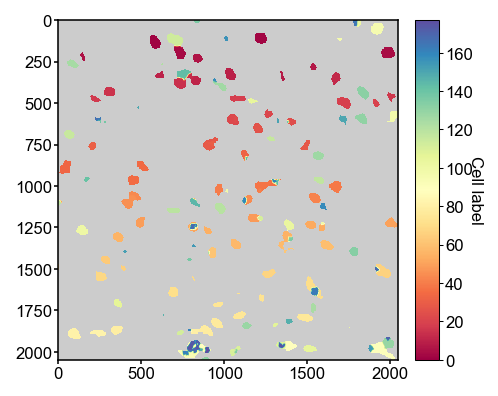

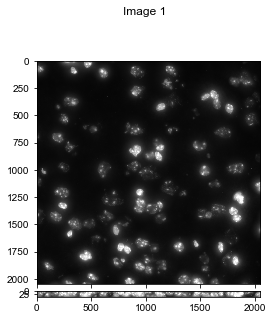

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_107_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_108.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_108.dax  in 5.175s
-- removing hot pixels for channels:['405'] in 3.038s
-- illumination correction for channels: 405, in 0.927s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.343s


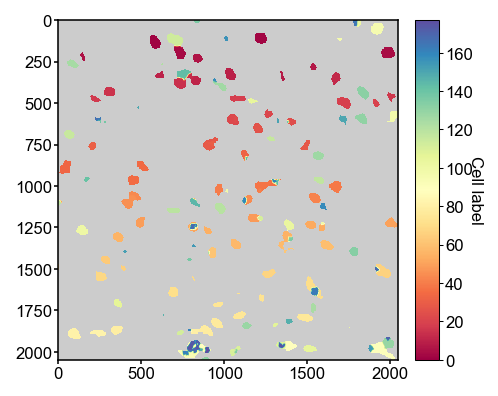

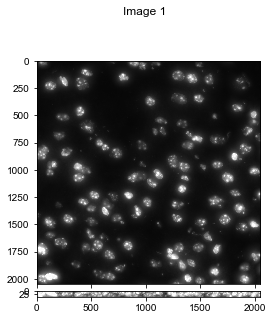

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_108_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_109.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_109.dax  in 3.888s
-- removing hot pixels for channels:['405'] in 3.086s
-- illumination correction for channels: 405, in 1.018s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.309s


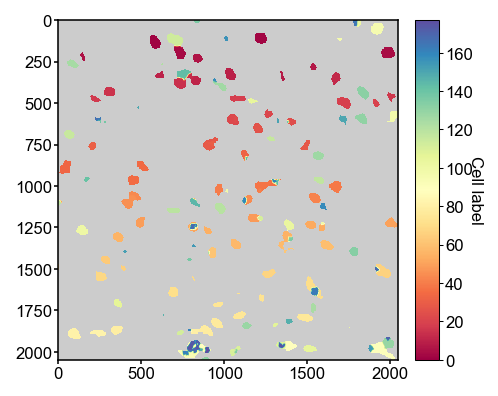

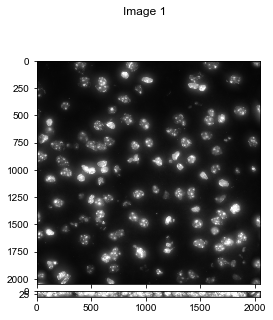

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_109_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_110.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_110.dax  in 4.859s
-- removing hot pixels for channels:['405'] in 3.091s
-- illumination correction for channels: 405, in 0.987s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.219s


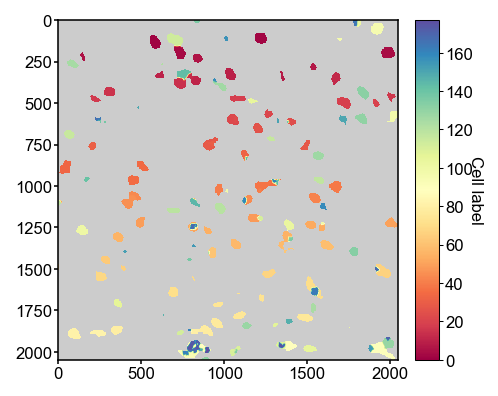

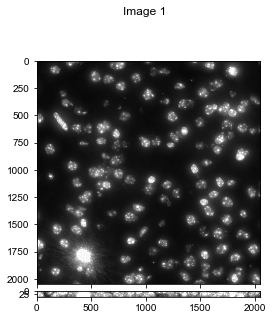

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_110_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_111.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_111.dax  in 3.700s
-- removing hot pixels for channels:['405'] in 2.964s
-- illumination correction for channels: 405, in 0.937s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.850s


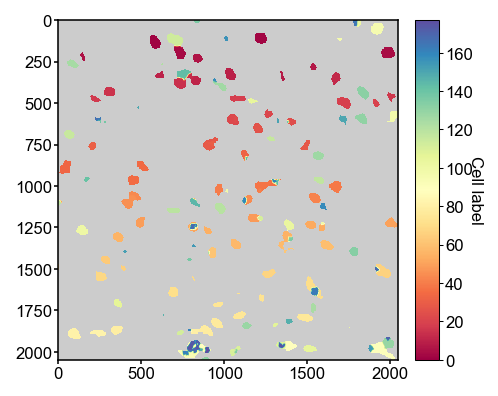

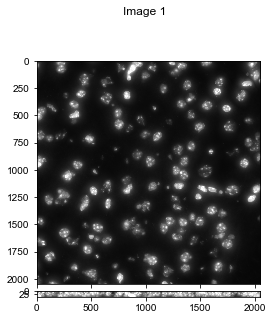

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_111_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_112.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_112.dax  in 4.913s
-- removing hot pixels for channels:['405'] in 2.983s
-- illumination correction for channels: 405, in 0.943s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.032s


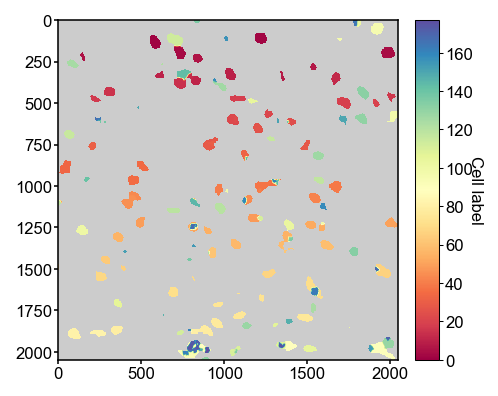

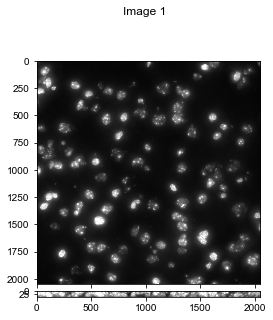

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_112_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_113.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_113.dax  in 4.156s
-- removing hot pixels for channels:['405'] in 3.059s
-- illumination correction for channels: 405, in 1.096s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.539s


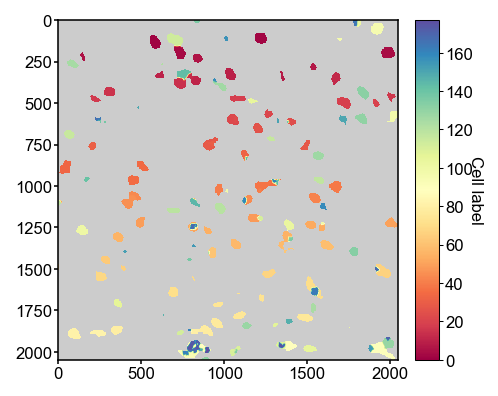

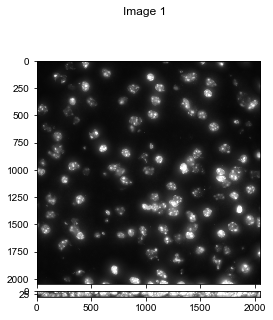

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_113_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_114.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_114.dax  in 4.537s
-- removing hot pixels for channels:['405'] in 3.042s
-- illumination correction for channels: 405, in 0.956s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.715s


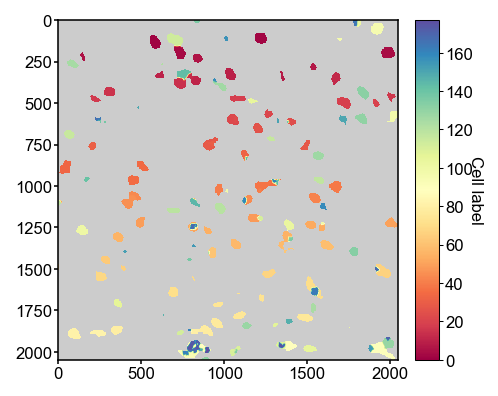

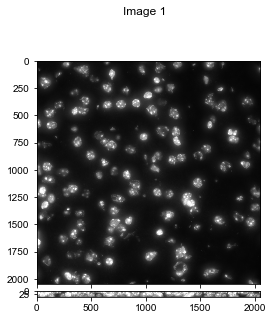

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_114_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_115.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_115.dax  in 3.945s
-- removing hot pixels for channels:['405'] in 3.024s
-- illumination correction for channels: 405, in 0.975s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.138s


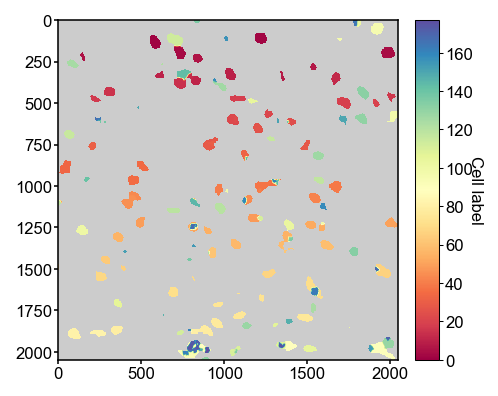

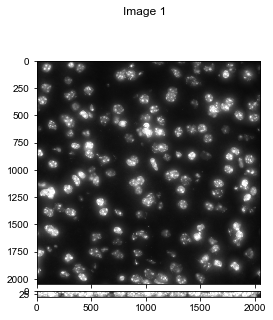

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_115_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_116.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_116.dax  in 5.220s
-- removing hot pixels for channels:['405'] in 3.072s
-- illumination correction for channels: 405, in 0.926s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.425s


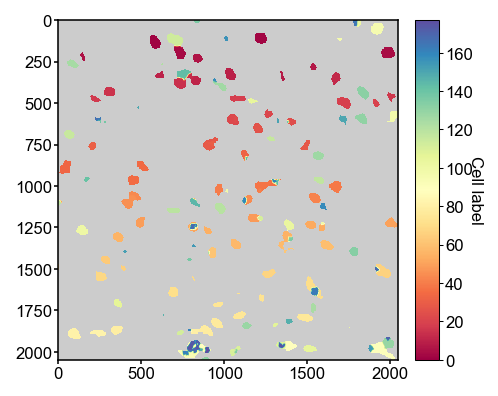

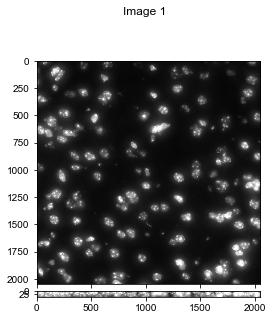

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_116_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_117.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_117.dax  in 3.807s
-- removing hot pixels for channels:['405'] in 3.010s
-- illumination correction for channels: 405, in 1.008s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.127s


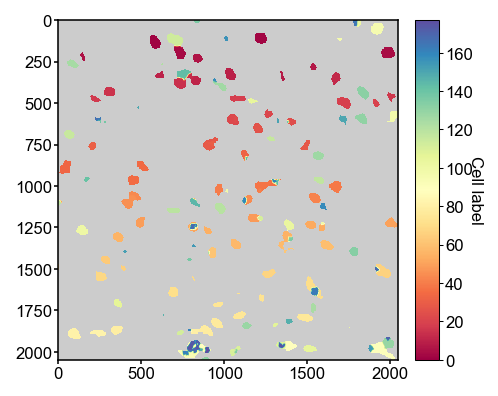

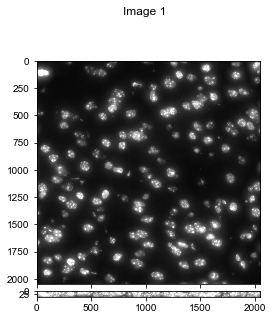

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_117_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_118.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_118.dax  in 5.136s
-- removing hot pixels for channels:['405'] in 2.956s
-- illumination correction for channels: 405, in 0.972s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.315s


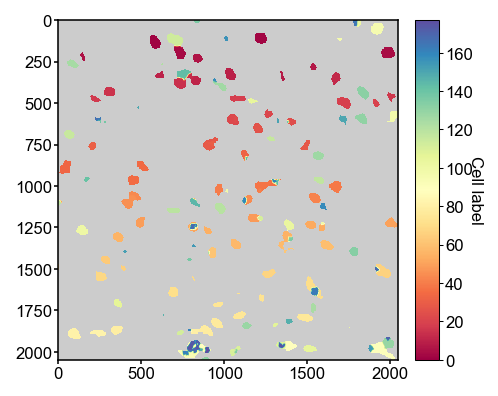

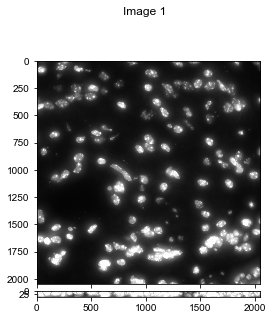

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_118_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_119.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_119.dax  in 4.025s
-- removing hot pixels for channels:['405'] in 3.387s
-- illumination correction for channels: 405, in 1.066s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.750s


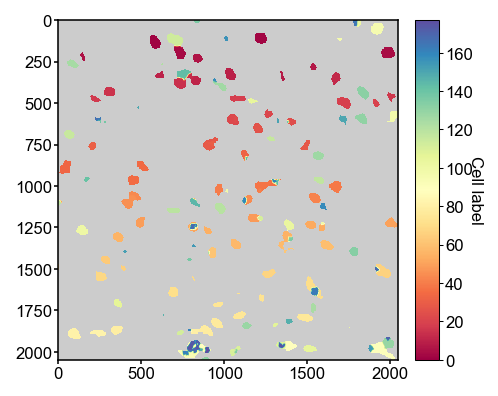

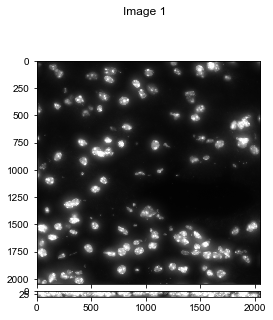

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_119_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_120.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_120.dax  in 5.128s
-- removing hot pixels for channels:['405'] in 3.261s
-- illumination correction for channels: 405, in 0.973s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.594s


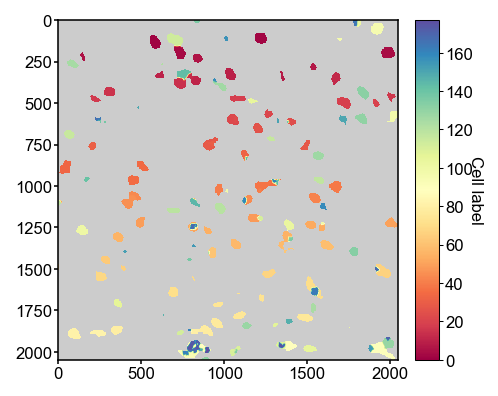

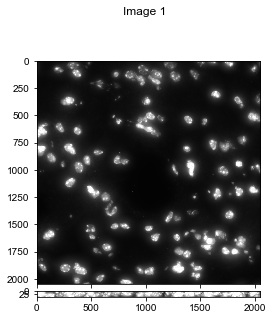

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_120_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_121.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_121.dax  in 4.090s
-- removing hot pixels for channels:['405'] in 3.197s
-- illumination correction for channels: 405, in 1.033s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.621s


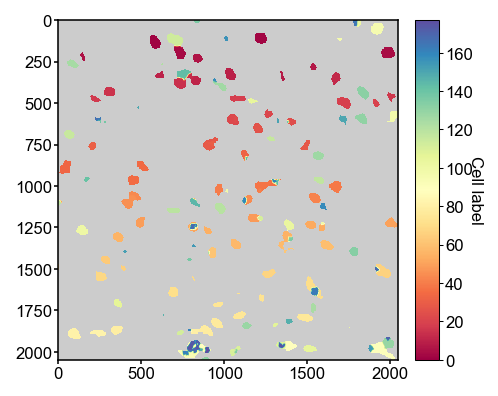

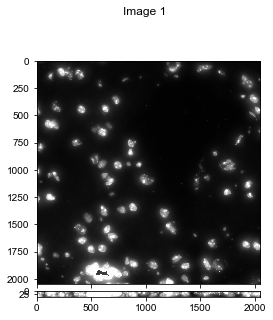

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_121_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_122.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_122.dax  in 4.780s
-- removing hot pixels for channels:['405'] in 3.279s
-- illumination correction for channels: 405, in 1.084s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.363s


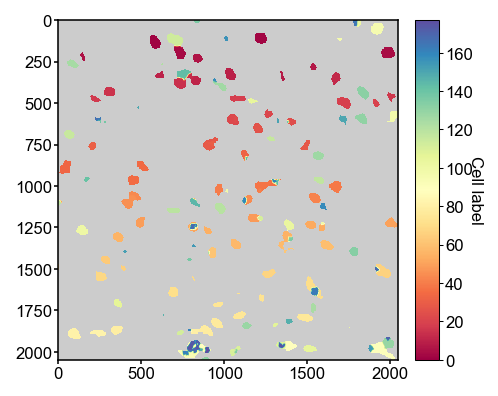

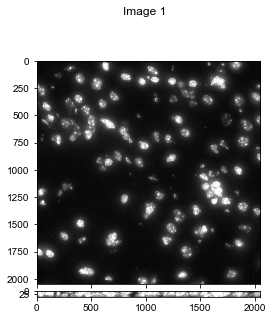

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_122_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_123.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_123.dax  in 4.250s
-- removing hot pixels for channels:['405'] in 3.275s
-- illumination correction for channels: 405, in 1.022s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.813s


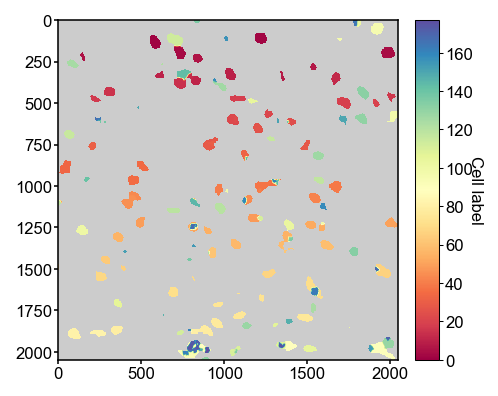

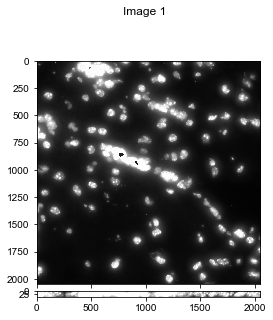

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_123_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_124.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_124.dax  in 5.140s
-- removing hot pixels for channels:['405'] in 3.248s
-- illumination correction for channels: 405, in 1.004s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.652s


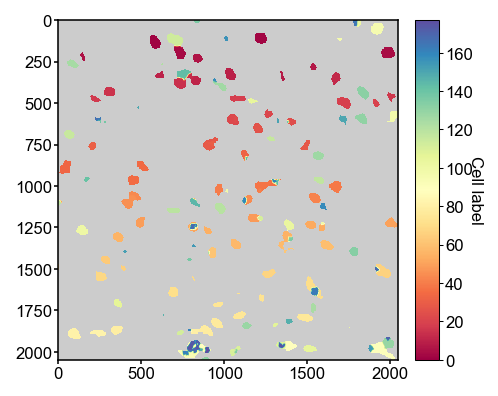

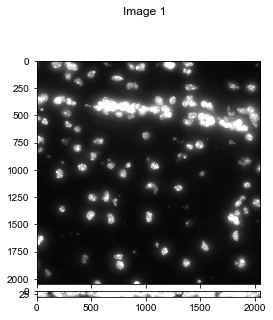

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_124_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_125.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_125.dax  in 3.383s
-- removing hot pixels for channels:['405'] in 3.308s
-- illumination correction for channels: 405, in 0.977s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.903s


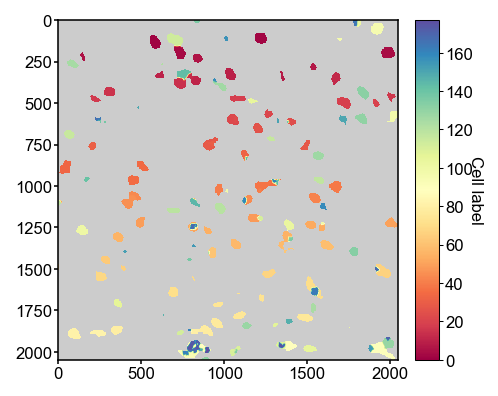

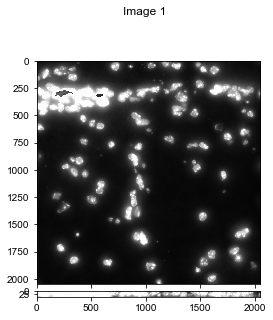

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_125_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_126.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_126.dax  in 5.066s
-- removing hot pixels for channels:['405'] in 3.287s
-- illumination correction for channels: 405, in 1.066s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.642s


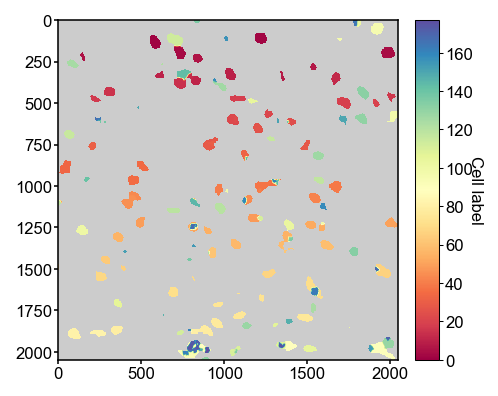

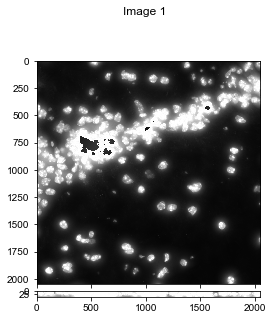

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_126_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_127.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_127.dax  in 3.398s
-- removing hot pixels for channels:['405'] in 3.387s
-- illumination correction for channels: 405, in 1.049s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.157s


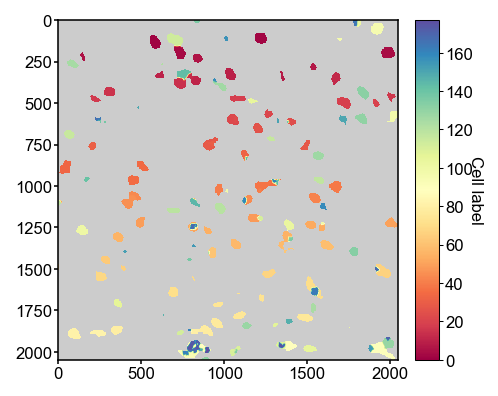

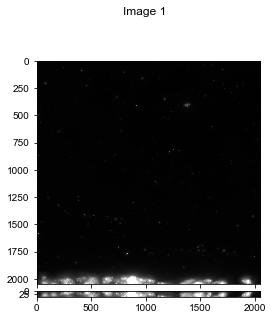

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_127_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_128.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_128.dax  in 4.834s
-- removing hot pixels for channels:['405'] in 3.224s
-- illumination correction for channels: 405, in 1.020s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.346s


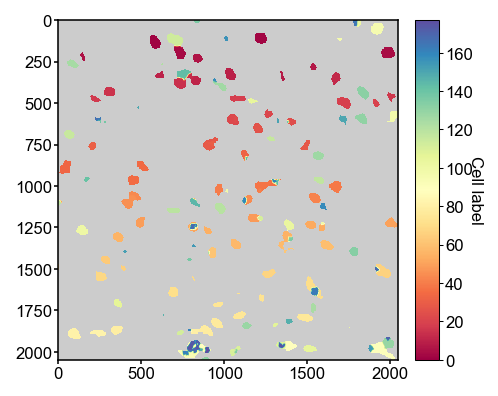

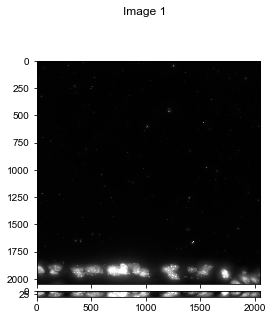

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_128_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_129.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_129.dax  in 3.440s
-- removing hot pixels for channels:['405'] in 3.372s
-- illumination correction for channels: 405, in 1.019s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.049s


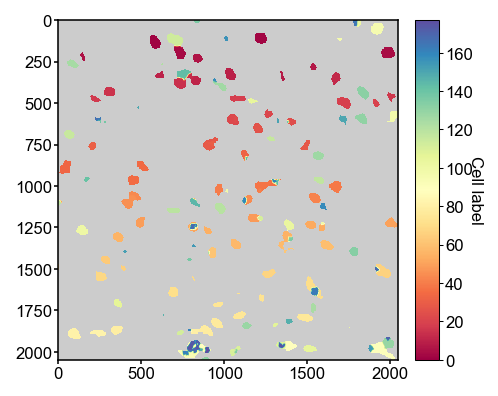

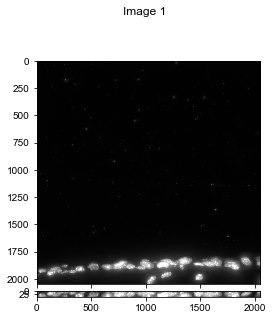

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_129_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_130.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_130.dax  in 5.335s
-- removing hot pixels for channels:['405'] in 3.287s
-- illumination correction for channels: 405, in 1.005s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.846s


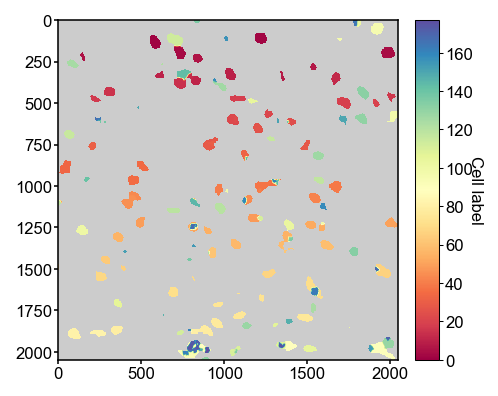

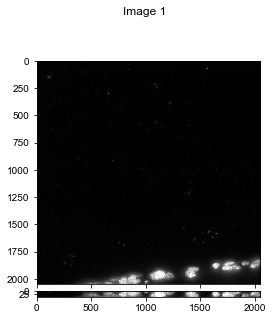

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_130_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_131.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_131.dax  in 3.687s
-- removing hot pixels for channels:['405'] in 3.303s
-- illumination correction for channels: 405, in 1.052s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.372s


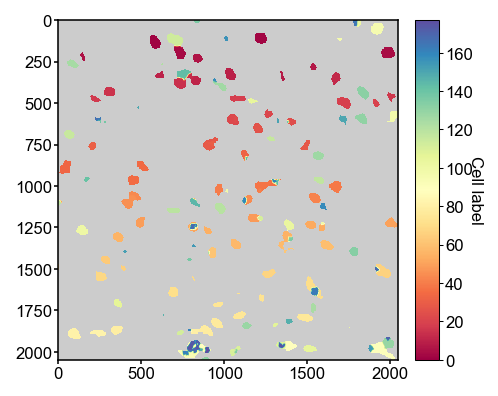

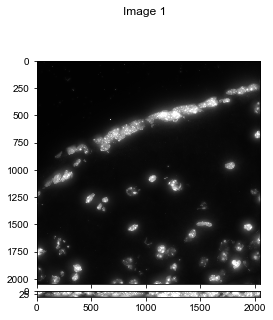

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_131_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_132.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_132.dax  in 4.840s
-- removing hot pixels for channels:['405'] in 3.221s
-- illumination correction for channels: 405, in 1.046s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.380s


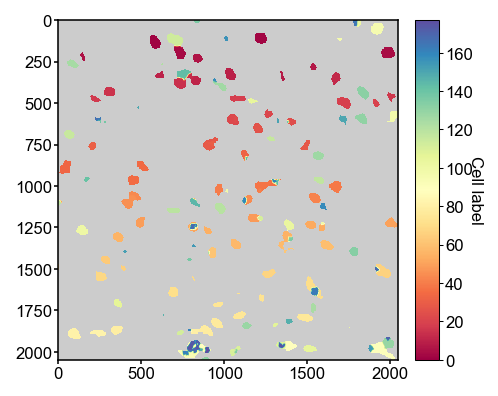

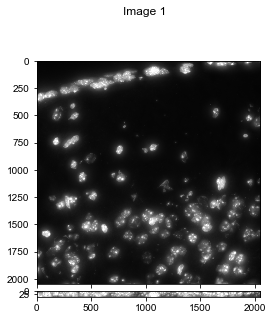

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_132_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_133.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_133.dax  in 4.033s
-- removing hot pixels for channels:['405'] in 3.180s
-- illumination correction for channels: 405, in 1.072s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.483s


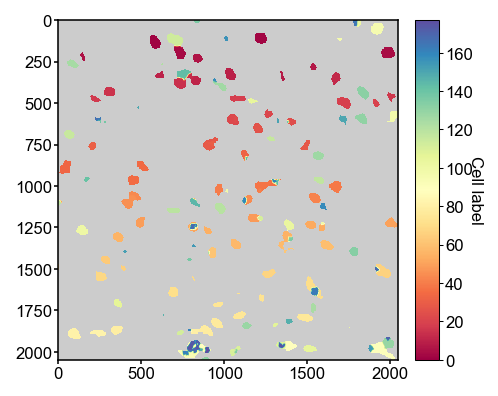

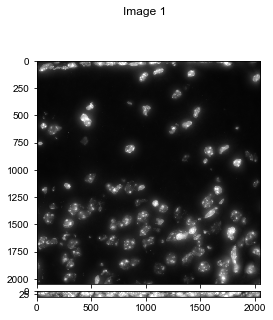

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_133_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_134.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_134.dax  in 5.225s
-- removing hot pixels for channels:['405'] in 3.309s
-- illumination correction for channels: 405, in 1.014s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.745s


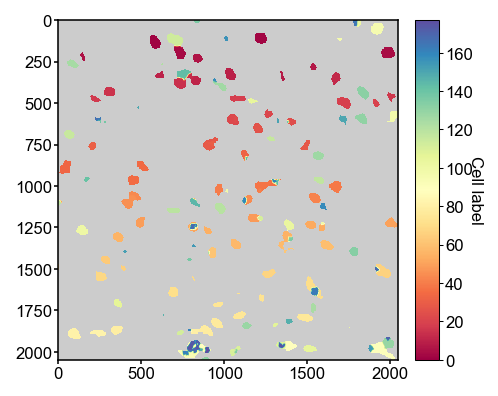

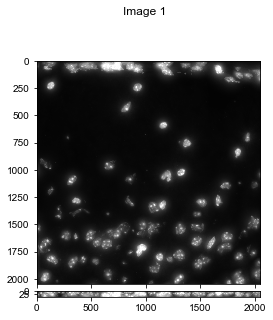

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_134_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_135.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_135.dax  in 3.982s
-- removing hot pixels for channels:['405'] in 3.323s
-- illumination correction for channels: 405, in 1.036s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.654s


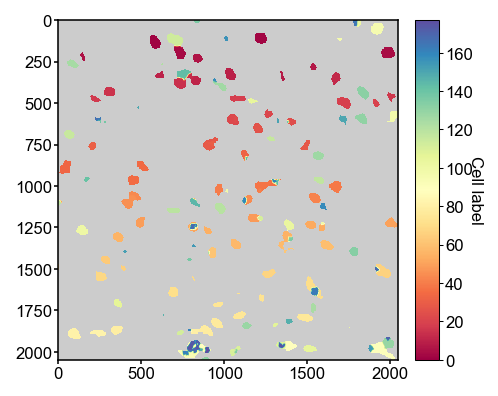

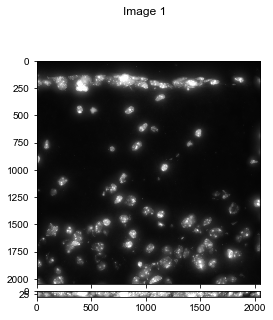

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_135_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_136.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_136.dax  in 5.463s
-- removing hot pixels for channels:['405'] in 3.254s
-- illumination correction for channels: 405, in 1.027s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.003s


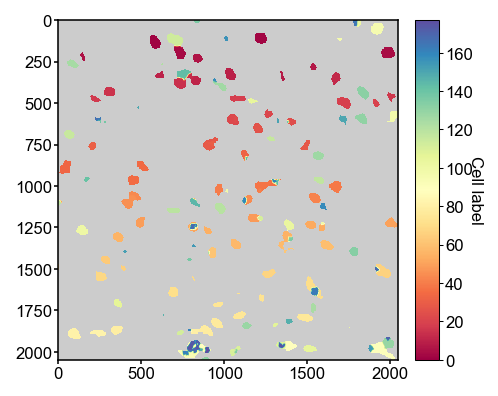

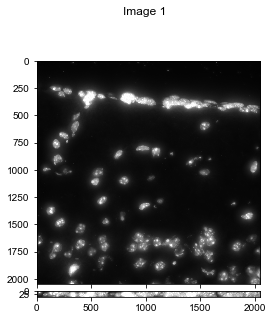

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_136_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_137.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_137.dax  in 4.052s
-- removing hot pixels for channels:['405'] in 3.277s
-- illumination correction for channels: 405, in 1.050s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.588s


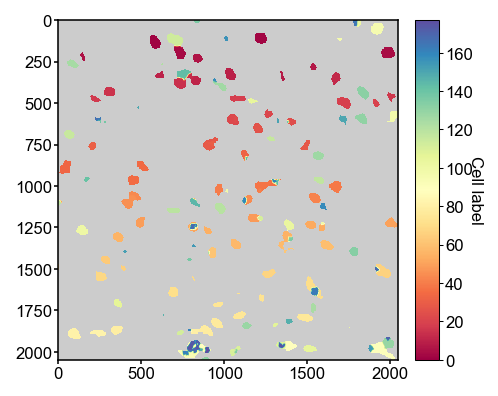

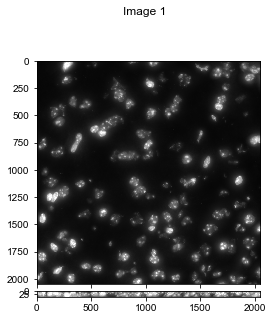

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_137_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_138.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_138.dax  in 3.236s
-- removing hot pixels for channels:['405'] in 3.169s
-- illumination correction for channels: 405, in 1.039s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 7.645s


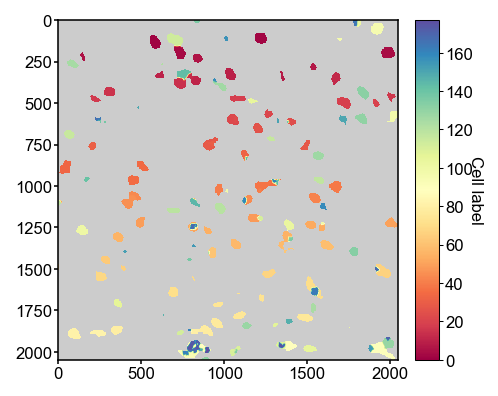

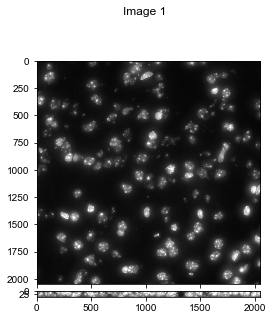

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_138_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_139.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_139.dax  in 4.123s
-- removing hot pixels for channels:['405'] in 3.293s
-- illumination correction for channels: 405, in 1.020s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.624s


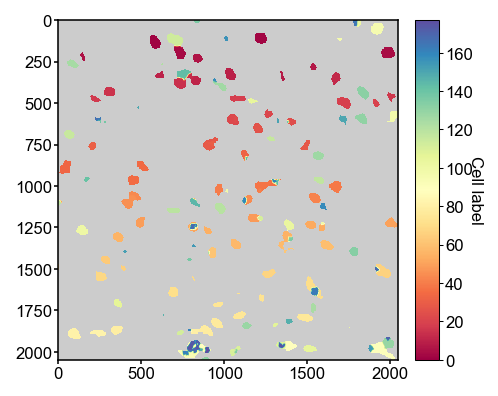

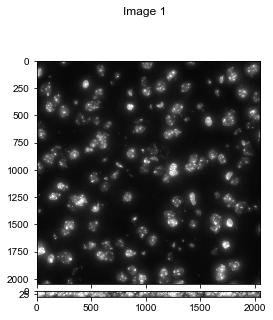

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_139_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_140.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_140.dax  in 4.906s
-- removing hot pixels for channels:['405'] in 3.265s
-- illumination correction for channels: 405, in 0.988s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.372s


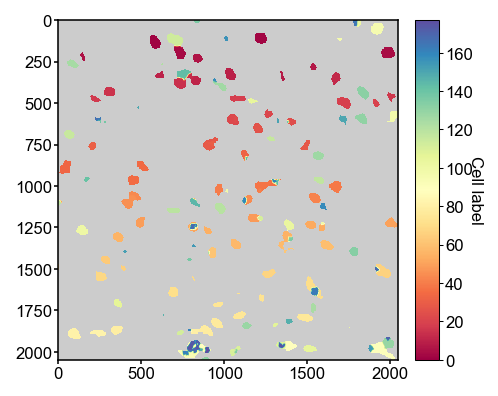

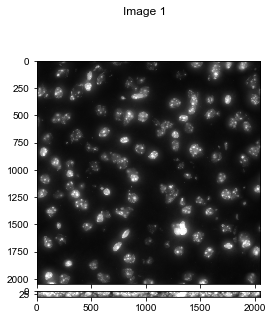

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_140_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_141.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_141.dax  in 4.447s
-- removing hot pixels for channels:['405'] in 3.169s
-- illumination correction for channels: 405, in 1.032s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.980s


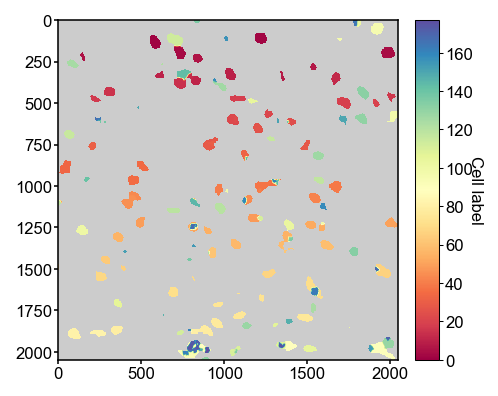

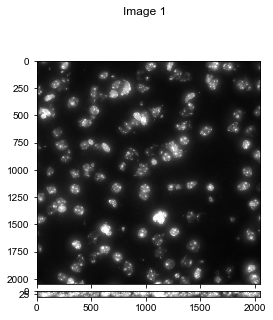

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_141_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_142.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_142.dax  in 5.439s
-- removing hot pixels for channels:['405'] in 3.197s
-- illumination correction for channels: 405, in 1.042s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.875s


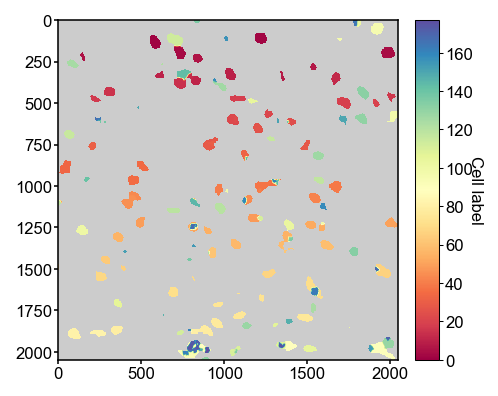

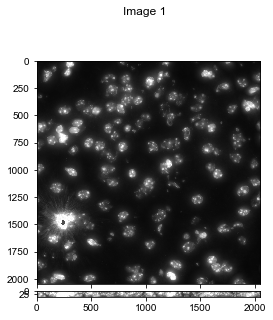

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_142_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_143.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_143.dax  in 4.236s
-- removing hot pixels for channels:['405'] in 3.364s
-- illumination correction for channels: 405, in 1.055s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.874s


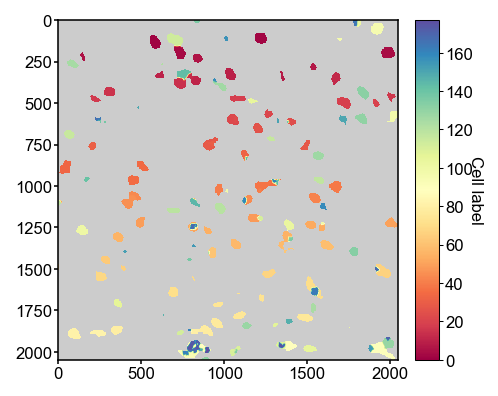

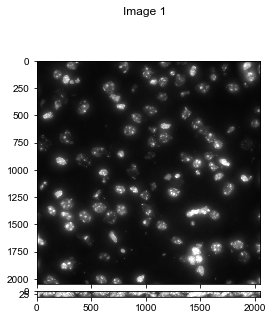

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_143_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_144.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_144.dax  in 5.533s
-- removing hot pixels for channels:['405'] in 3.152s
-- illumination correction for channels: 405, in 1.036s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.003s


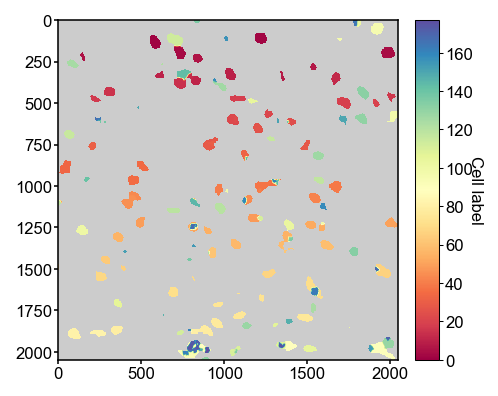

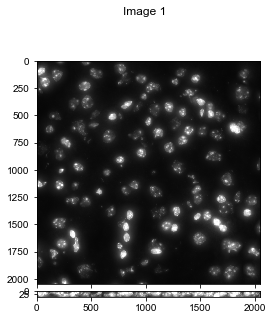

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_144_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_145.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_145.dax  in 3.937s
-- removing hot pixels for channels:['405'] in 3.136s
-- illumination correction for channels: 405, in 1.080s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.373s


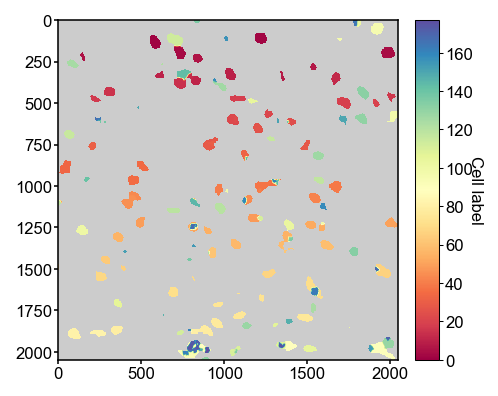

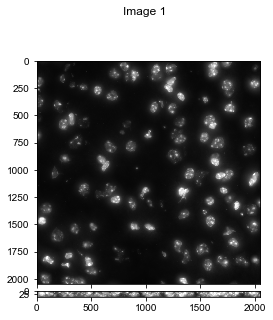

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_145_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_146.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_146.dax  in 5.026s
-- removing hot pixels for channels:['405'] in 3.202s
-- illumination correction for channels: 405, in 1.042s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.458s


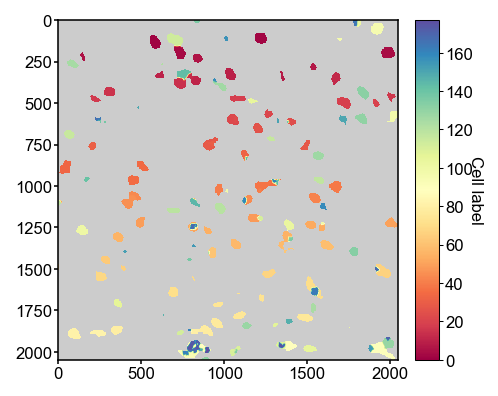

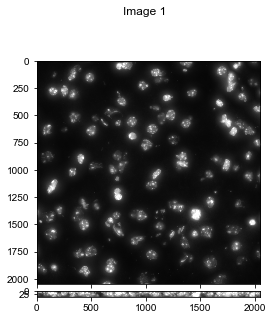

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_146_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_147.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_147.dax  in 4.310s
-- removing hot pixels for channels:['405'] in 3.199s
-- illumination correction for channels: 405, in 1.019s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.825s


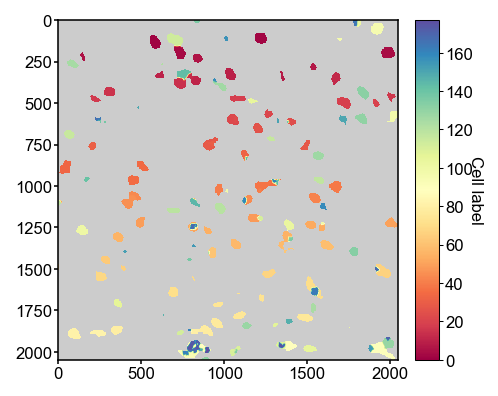

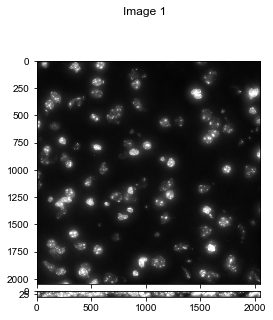

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_147_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_148.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_148.dax  in 4.690s
-- removing hot pixels for channels:['405'] in 3.149s
-- illumination correction for channels: 405, in 1.134s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.299s


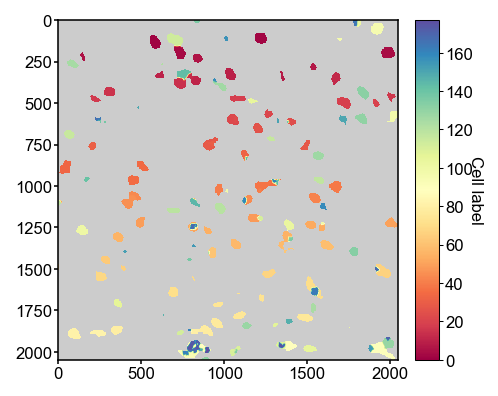

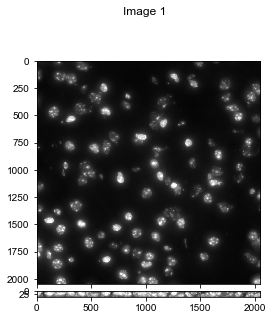

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_148_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_149.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_149.dax  in 3.979s
-- removing hot pixels for channels:['405'] in 3.354s
-- illumination correction for channels: 405, in 1.020s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.565s


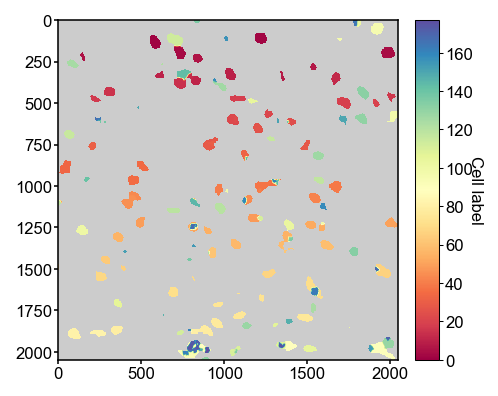

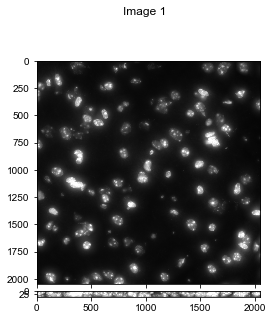

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_149_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_150.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_150.dax  in 5.583s
-- removing hot pixels for channels:['405'] in 3.372s
-- illumination correction for channels: 405, in 0.987s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.173s


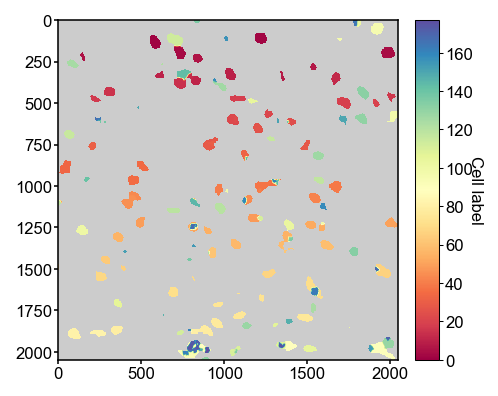

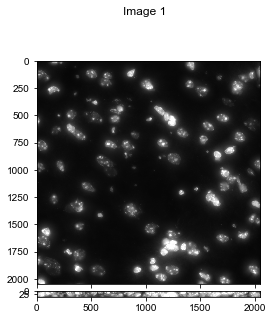

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_150_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_151.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_151.dax  in 3.974s
-- removing hot pixels for channels:['405'] in 3.293s
-- illumination correction for channels: 405, in 1.032s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.594s


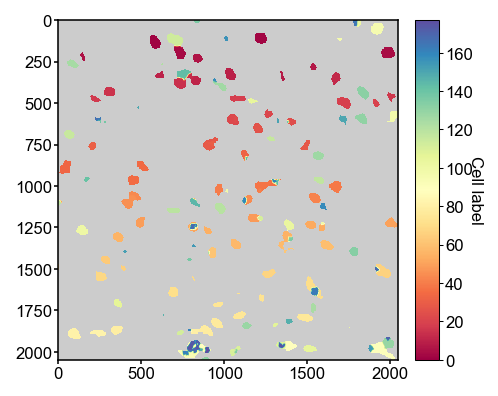

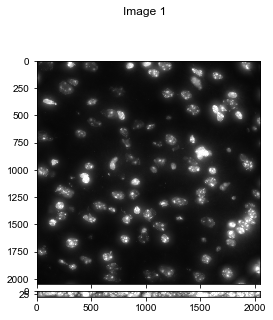

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_151_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_152.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_152.dax  in 5.178s
-- removing hot pixels for channels:['405'] in 3.237s
-- illumination correction for channels: 405, in 1.029s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.749s


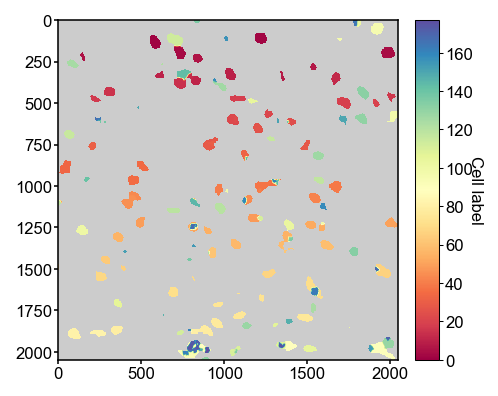

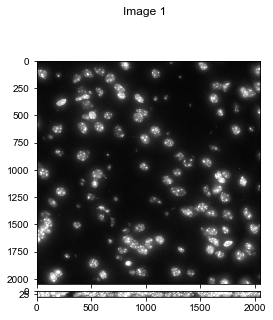

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_152_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_153.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_153.dax  in 4.007s
-- removing hot pixels for channels:['405'] in 3.324s
-- illumination correction for channels: 405, in 1.034s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.574s


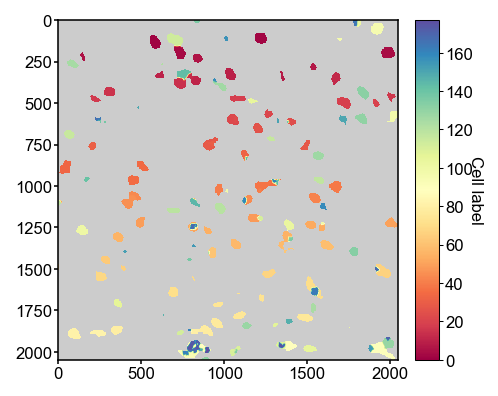

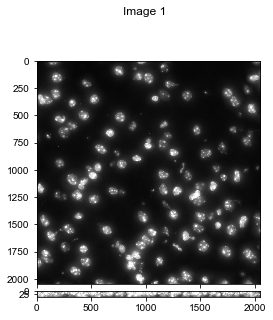

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_153_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_154.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_154.dax  in 5.192s
-- removing hot pixels for channels:['405'] in 3.257s
-- illumination correction for channels: 405, in 1.006s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.675s


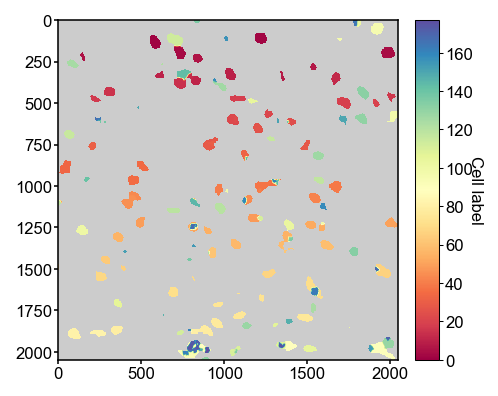

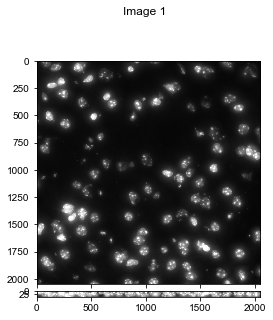

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_154_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_155.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_155.dax  in 4.214s
-- removing hot pixels for channels:['405'] in 3.200s
-- illumination correction for channels: 405, in 1.049s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.747s


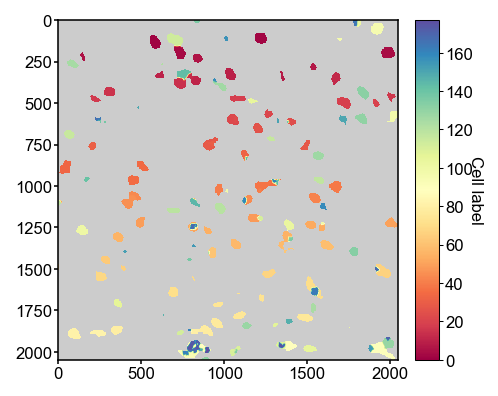

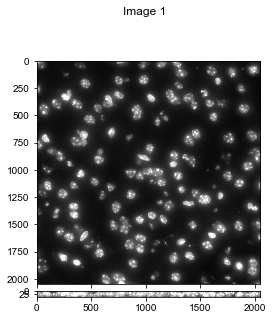

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_155_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_156.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_156.dax  in 4.890s
-- removing hot pixels for channels:['405'] in 3.215s
-- illumination correction for channels: 405, in 1.002s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.357s


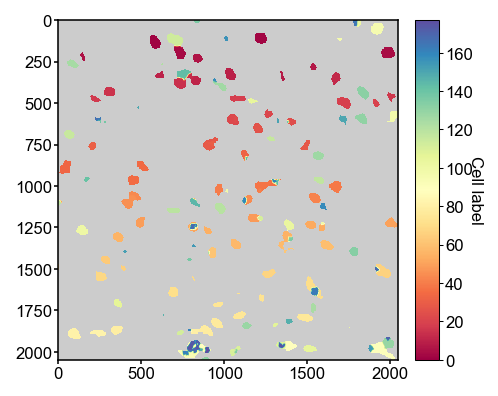

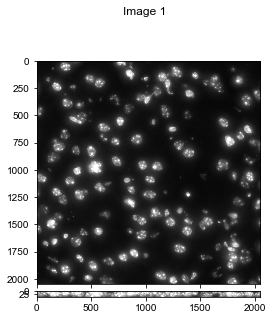

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_156_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_157.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_157.dax  in 4.884s
-- removing hot pixels for channels:['405'] in 3.278s
-- illumination correction for channels: 405, in 1.064s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.438s


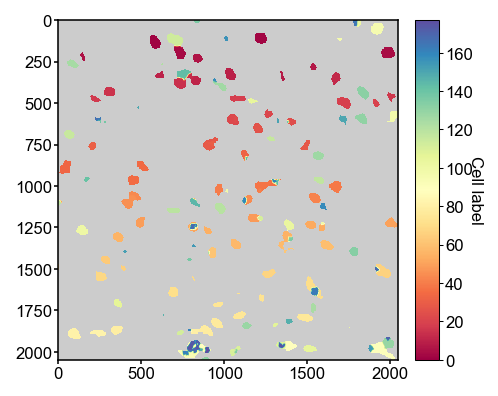

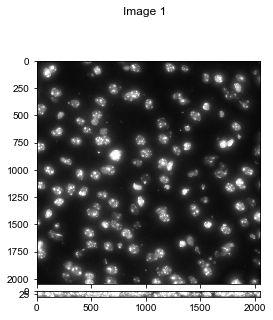

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_157_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_158.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_158.dax  in 4.320s
-- removing hot pixels for channels:['405'] in 3.377s
-- illumination correction for channels: 405, in 1.017s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.969s


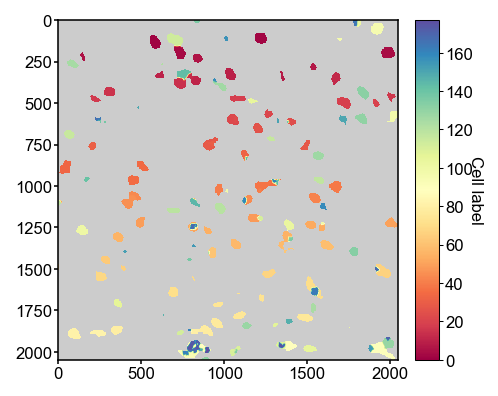

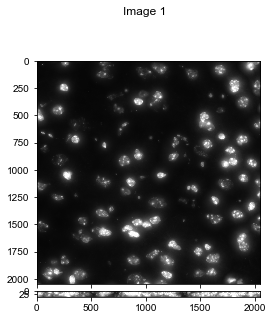

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_158_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_159.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_159.dax  in 3.847s
-- removing hot pixels for channels:['405'] in 3.231s
-- illumination correction for channels: 405, in 1.050s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.428s


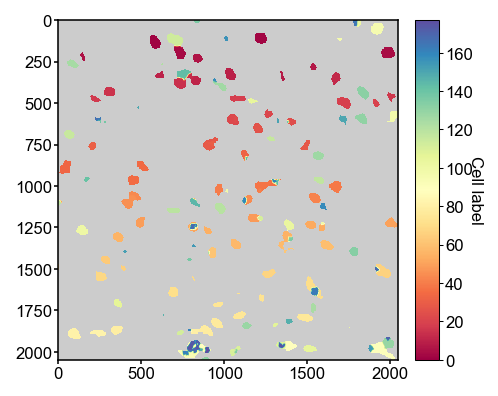

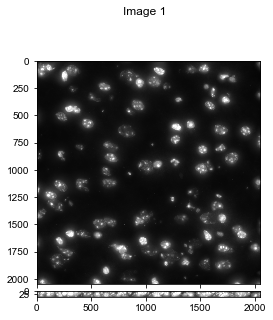

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_159_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_160.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_160.dax  in 5.361s
-- removing hot pixels for channels:['405'] in 3.183s
-- illumination correction for channels: 405, in 1.036s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 9.799s


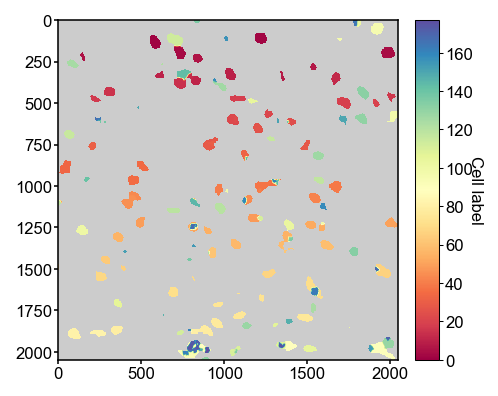

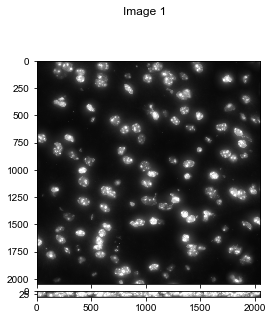

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_160_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_161.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_161.dax  in 3.848s
-- removing hot pixels for channels:['405'] in 3.282s
-- illumination correction for channels: 405, in 1.065s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 8.391s


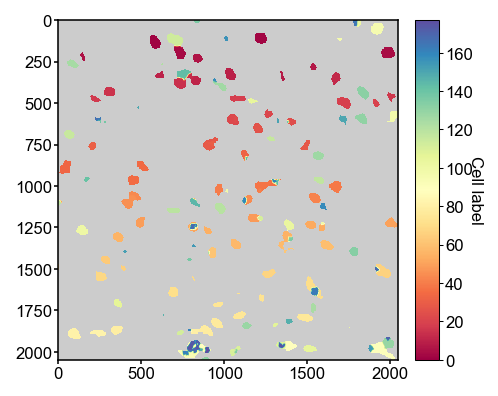

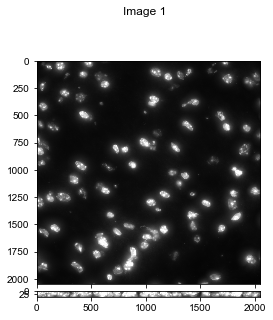

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_161_Segmentation.png
- correct the whole fov for image: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_162.dax
-- loading illumination correction profile from file:
	 405 illumination_correction_405_2048x2048.npy
-- loading image from file:\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\H0M1\Conv_zscan_162.dax  in 6.226s
-- removing hot pixels for channels:['405'] in 3.336s
-- illumination correction for channels: 405, in 0.965s
-- warp image with chromatic correction for channels: [] and drift:[0. 0. 0.] in 0.000s
-- finish correction in 10.740s


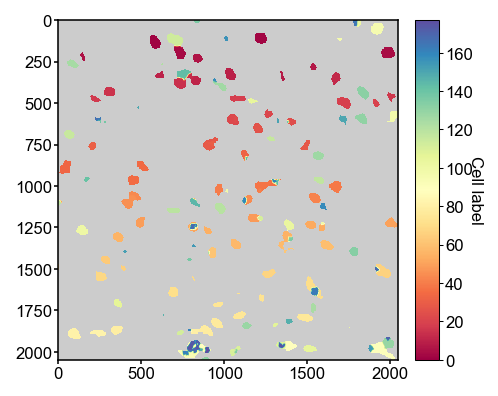

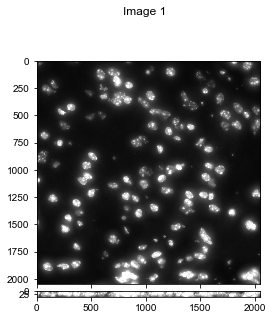

-- save iamage to file: \\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation\Figures\Conv_zscan_162_Segmentation.png


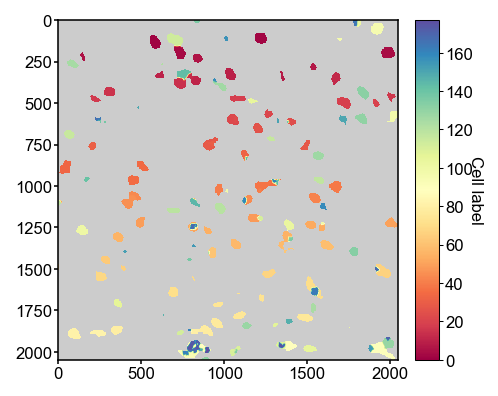

In [11]:
%matplotlib inline
# Load image
for _fov in fovs:
    image_filename = os.path.join(ref_folder, _fov)
    
    segmentation_filename = os.path.join(segmentation_folder, 
                                         _fov.replace('.dax', '_Segmentation.npy') )
    dapi_filename = os.path.join(segmentation_folder, 
                                 os.path.basename(_fov).replace('.dax', '_Dapi.npy') )

    if os.path.exists(dapi_filename):
        _dapi_im = np.load(dapi_filename)
    else:
        # load image
        _dapi_im, = ia.io_tools.load.correct_fov_image(
            image_filename, 405,
            single_im_size=[50,2048,2048],
            num_empty_frames=0, num_buffer_frames=0,
            all_channels=[750,647,561,488,405],
            calculate_drift=False, 
            correction_folder=correction_folder,
            illumination_corr=True, hot_pixel_corr=True,
        )[0]
        # save
        np.save(dapi_filename.split('.npy')[0], _dapi_im)
    # vis
    visual_tools.imshow_mark_3d_v2([_dapi_im])
    
    if os.path.exists(segmentation_filename):
        _mask = np.load(segmentation_filename)
    else:
        seg_class = cell.Cellpose_Segmentation_3D(_dapi_im, None, pixel_sizes,
                                                  save_filename=segmentation_filename,
                                                  )

        _masks = seg_class.run()
        seg_class.save()
        seg_class.clear()
        #delattr(seg_class, 'segmentation_masks')
        #del(seg_class)

    seg_fig_name = os.path.join(segmentation_figure_folder,
                                _fov.replace('.dax', '_Segmentation.png'))
    plot_segmentation.plot_segmentation(_masks,
                                        save=True, save_filename=seg_fig_name)                                             
    

In [5]:
print(segmentation_folder)

\\10.245.74.158\Chromatin_NAS_0\20220208-P_brain_M1_nonclear\Segmentation
